# **Modelo Final**
# **Radiografías de Tórax**
# ITESM - MNA V

## Proyecto Integrador - TC5035.10

## Profesora: Dra. Grettel Barceló Alonso


### Equipo 19

Héctor Segura Quintanilla (A01154108)

Julio César García Escoto (A01795050)

Francisco Medellín Zertuche (A01794044)


# Introducción

En este cuaderno continuamos el desarrollo de nuestro sistema de clasificación de radiografías de tórax para el diagnóstico asistido de cardiopatías congénitas. Tras la fase inicial de experimentación con múltiples arquitecturas de visión por computadora, hemos identificado dos modelos con el mejor desempeño global: ResNet50 y EfficientNet. Ambos han demostrado una capacidad sólida para extraer características discriminativas del tórax pediátrico, incluso ante la variabilidad anatómica y posibles imperfecciones en la adquisición de las imágenes.
El objetivo de este documento es optimizar y combinar estas dos arquitecturas, siguiendo tres etapas principales:

**Búsqueda de hiperparámetros (Grid Search):**
Ajustaremos cuidadosamente parámetros relevantes en ResNet50 y EfficientNet para maximizar su precisión y robustez ante el desbalanceo entre clases.

**Estrategia de Ensamble:**
Una vez entrenados y seleccionados los mejores modelos individuales, implementaremos un esquema de votación o promedio ponderado de sus predicciones, con el fin de reducir errores sistemáticos y mejorar la estabilidad del clasificador final.

**Evaluación y Explicabilidad:**
Realizaremos una evaluación completa del rendimiento usando métricas a nivel global y por clase. Finalmente, aplicaremos Grad-CAM para generar interpretaciones visuales que nos permitan validar que los modelos realmente se enfocan en las regiones anatómicas relevantes del tórax al tomar sus decisiones, añadiendo un componente crucial de explicabilidad clínica.

Con ello, buscamos no solo mejorar el rendimiento cuantitativo del sistema, sino también aumentar la confianza en los resultados desde una perspectiva médica, fortaleciendo la utilidad del modelo como apoyo en la práctica diagnóstica.



# Instalación de librerías

In [ ]:
!pip install -q scikit-image
!pip install -q ImageHash

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.7/296.7 kB 13.4 MB/s eta 0:00:00
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/pip/_internal/cli/base_command.py", line 179, in exc_logging_wrapper
    status = run_func(*args)
             ^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/pip/_internal/cli/req_command.py", line 67, in wrapper
    return func(self, options, args)
           ^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/pip/_internal/commands/install.py", line 447, in run
    conflicts = self._determine_conflicts(to_install)
                ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/pip/_internal/commands/install.py", line 578, in _determine_conflicts
    return check_install_conflicts(to_install)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/pip/_internal/operations/check.py", line 101, in check_install_

KeyboardInterrupt: 

In [ ]:
!pip install -q pytorch-grad-cam

In [ ]:
# --- Bibliotecas Estándar de Python ---
import os
import random
import math
import shutil
import multiprocessing
from glob import glob
from pathlib import Path
from datetime import datetime
from collections import Counter, defaultdict
from concurrent.futures import ProcessPoolExecutor, as_completed

# --- Manejo de Datos y Visualización ---
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.auto import tqdm

# --- Procesamiento de Imágenes ---
import cv2
import imagehash
from PIL import Image
from PIL.Image import Resampling

# --- Machine Learning (General) ---
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import (confusion_matrix, classification_report,
                             roc_auc_score, average_precision_score)
from tensorflow.keras.utils import to_categorical

# --- Deep Learning (PyTorch y TorchVision) ---
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.optim import AdamW
from torch.optim.lr_scheduler import OneCycleLR
from torch.utils.data import Dataset, DataLoader
from torch.cuda.amp import autocast, GradScaler

from torchvision import models, transforms, datasets
from torchvision.models import (DenseNet121_Weights,
                                DenseNet201_Weights,
                                ResNet50_Weights,
                                Swin_T_Weights)

# --- Entorno de Notebook ---
from IPython.display import Image as IPImage, display

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
# CREAMOS UNA CLASE QUE NOS AYUDARA A CARGAR LOS DATOS PARA LOS MODELOS (UTILIZA EL FORMATO DE DATASET GENERADO EN EL PUNTO 5)
# ESTA CLASE ADAPTA LAS RUTAS RELATIVAS A RUTAS ABSOLUTAS DEL ENTORNO DE EJECUCIÓN
class DatasetLoader:
    """
    Carga y prepara los DataFrames de entrenamiento, validación y prueba
    desde archivos CSV contenidos en una carpeta específica.
    """

    def __init__(self, dataset_path: str):
        """
        Inicializa el cargador de datasets con la ruta base de la carpeta.

        Args:
            dataset_path (str): La ruta absoluta o relativa a la carpeta
                                 que contiene los archivos CSV (train.csv,
                                 val.csv, test.csv).
        """
        # Normaliza la ruta y la guarda
        self.dataset_path = os.path.abspath(dataset_path)
        print(f"Ruta base del dataset establecida: {self.dataset_path}")

    def _load_and_process_df(self, filename: str) -> tuple[pd.DataFrame, pd.DataFrame]:
        """
        Método interno para cargar un CSV específico, preprocesar las rutas
        y dividir el DataFrame en X (rutas de imagen) y Y (etiquetas).

        Args:
            filename (str): Nombre del archivo CSV (ej. 'train.csv').

        Returns:
            tuple[pd.DataFrame, pd.DataFrame]: Una tupla con (X, Y) DataFrames.
        """
        file_path = os.path.join(self.dataset_path, filename)

        if not os.path.exists(file_path):
            raise FileNotFoundError(f"El archivo '{filename}' no se encontró en la ruta: {file_path}")

        df = pd.read_csv(file_path)

        # Verificar que las columnas 'image_path' y 'label' existan
        if 'image_path' not in df.columns or 'label' not in df.columns:
            raise ValueError(f"El archivo '{filename}' debe contener las columnas 'image_path' y 'label'.")

        print(f"Archivo {filename} leído. Filas: {len(df)}")

        df['image_path'] = df['image_path'].apply(
            lambda x: os.path.join(self.dataset_path, x)
        )

        # Dividir el DataFrame
        # X: solo la columna 'image_path'
        X = df[['image_path']]
        # Y: solo la columna 'label'
        Y = df[['label']]

        return X, Y


    def get_dataframes(self) -> tuple[pd.DataFrame, pd.DataFrame, pd.DataFrame, pd.DataFrame, pd.DataFrame, pd.DataFrame]:
        """
        Carga y procesa los tres archivos CSV (train, val, test) y regresa
        seis DataFrames (X_train, X_val, X_test, Y_train, Y_val, Y_test).

        Returns:
            tuple: (x_train, x_val, x_test, y_train, y_val, y_test)
        """
        print("\nIniciando carga y preprocesamiento de DataFrames...")

        # Cargar y procesar el conjunto de entrenamiento
        x_train, y_train = self._load_and_process_df('train.csv')

        # Cargar y procesar el conjunto de validación
        x_val, y_val = self._load_and_process_df('val.csv')

        # Cargar y procesar el conjunto de prueba
        x_test, y_test = self._load_and_process_df('test.csv')

        print("\nCarga de DataFrames completada exitosamente.")

        # Regresar los 6 DataFrames
        return x_train, x_val, x_test, y_train, y_val, y_test

In [ ]:
# CARGAMOS LOS DATASET GENERADOS EN EL PUNTO 5 A UNA VARIABLE (SE CARGAN DESDE EL ALMACENAMIENTO PARA NO RECREAR LOS SPLIT EN CADA EJECUCIÓN)
dt_loader = DatasetLoader('/content/drive/MyDrive/CARDIOS - PROYECTO INTEGRADOR/dataset_seg')
x_train_og, x_val_og, x_test_og, y_train_og, y_val_og, y_test_og = dt_loader.get_dataframes()

# dt_loader_crop = DatasetLoader('/content/drive/MyDrive/CARDIOS - PROYECTO INTEGRADOR/dataset_crop')
# x_train_crop, x_val_crop, x_test_crop, y_train_crop, y_val_crop, y_test_crop = dt_loader_crop.get_dataframes()

# Definición de clases y funciones

In [ ]:
class ImageVersioner:
    """
    Clase para crear y ejecutar un pipeline de procesamiento de imágenes
    unificada y optimizada con paralelismo. VERSIÓN CORREGIDA.
    """
    def __init__(self, initial_params=None, stepVersioning=True, max_workers=multiprocessing.cpu_count()):
        self.initial_params = initial_params if initial_params is not None else {}
        self.step_versioning = stepVersioning
        self.pipeline_steps = []
        self.max_workers = max_workers
        self.class_mapping = {
            'Normal': 0, 'ASD': 1, 'PDA': 2, 'VSD': 3
        }
        self.num_classes = len(self.class_mapping)
        self.inverse_class_mapping = {v: k for k, v in self.class_mapping.items()}

    def createPipeline(self, steps: list):
        self.pipeline_steps = steps
        print(f"Pipeline creado con {len(steps)} pasos.")

    @staticmethod
    def _save_versioned_image_static(image, base_path, step_name, original_filename, log_enabled):
        step_dir = os.path.join(base_path, step_name)
        os.makedirs(step_dir, exist_ok=True)
        save_path = os.path.join(step_dir, original_filename)
        image.save(save_path)
        if log_enabled:
            print(f"  -> Imagen guardada en: {save_path}")

    @staticmethod
    def _process_static(row_data, index, pipeline_steps, initial_params, base_path, step_versioning, log): # <--- CAMBIO CLAVE: Recibe el índice
        """
        Función de procesamiento estática. Retorna una tupla (índice, PIL.Image).
        """
        image_path = row_data['image_path']
        original_filename = os.path.basename(image_path)
        if log:
            print(f"\nProcesando imagen: {original_filename}")
        try:
            current_image = Image.open(image_path).convert("RGB")
            if step_versioning:
                ImageVersioner._save_versioned_image_static(current_image, base_path, "00_original", original_filename, log)
            for step_name, step_function in pipeline_steps:
                current_image = step_function(current_image, **initial_params)
                if step_versioning:
                    ImageVersioner._save_versioned_image_static(current_image, base_path, step_name, original_filename, log)

            # <--- CAMBIO CLAVE: Retorna el índice junto con la imagen
            return (index, current_image)
        except Exception as e:
            tqdm.write(f"Error procesando {original_filename}: {e}")
            return (index, None) # <--- CAMBIO CLAVE: Retorna el índice incluso en error

    def pipeline(self, data_df: pd.DataFrame, versioning_root_path: str, label: str, log: bool = False) -> np.ndarray:
        timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
        version_folder = f"{label}_{timestamp}"
        base_path = os.path.join(versioning_root_path, version_folder)
        os.makedirs(base_path, exist_ok=True)
        print(f"Iniciando pipeline y versionado en: {base_path} con {self.max_workers} procesos paralelos.")

        # <--- CAMBIO CLAVE: Guardará tuplas (índice, imagen)
        processing_results = []

        with ProcessPoolExecutor(max_workers=self.max_workers) as executor:
            futures = [
                executor.submit(self._process_static,
                                row,
                                index, # <--- CAMBIO CLAVE: Pasa el índice original
                                self.pipeline_steps,
                                self.initial_params,
                                base_path,
                                self.step_versioning,
                                log)
                for index, row in data_df.iterrows()
            ]

            iterator = tqdm(as_completed(futures), total=len(futures), desc=f"Procesando {label}", disable=log)

            for future in iterator:
                result_tuple = future.result()
                if result_tuple[1] is not None: # Checa si la imagen no es None
                    processing_results.append(result_tuple)

            if not log:
                iterator.close()

        # <--- CAMBIO CLAVE: Reordenar los resultados según el índice original
        print("\nReordenando resultados...")
        processing_results.sort(key=lambda x: x[0])

        # <--- CAMBIO CLAVE: Extraer solo las imágenes, ahora en el orden correcto
        final_images_pil_list = [img for idx, img in processing_results]

        print("Convirtiendo a tensor y normalizando...")
        if not final_images_pil_list:
            print("Advertencia: No se procesó ninguna imagen.")
            return np.array([])

        x_np_list = [np.array(img, dtype='uint8') for img in final_images_pil_list]
        x_tensor = np.stack(x_np_list, axis=0)

        if len(x_tensor.shape) == 3:
            x_tensor = np.expand_dims(x_tensor, axis=-1)

        x_normalized = x_tensor.astype('float32') / 255.0

        print(f"Pipeline finalizado. Tensor X generado con forma: {x_normalized.shape}")
        return x_normalized

    def transform_y_encoded(self, y_df: pd.DataFrame) -> np.ndarray:
        if 'label' not in y_df.columns:
            raise ValueError("El DataFrame de etiquetas debe contener la columna 'label'.")
        y_integers = y_df['label'].map(self.class_mapping)
        if y_integers.isnull().any():
            unmapped_labels = y_df['label'][y_integers.isnull()].unique()
            raise ValueError(f"Se encontraron etiquetas no definidas en el mapeo: {unmapped_labels}")
        y_encoded = to_categorical(y_integers, num_classes=self.num_classes)
        print(f"Etiquetas codificadas generadas con forma: {y_encoded.shape}")
        return y_encoded

In [ ]:
# Funciones Auxiliares

def _pil_to_cv2_gray(image_pil):
    """Convierte PIL (L o RGB) a NumPy/CV2 en escala de grises."""
    img_gray_pil = image_pil.convert('L')
    return np.array(img_gray_pil)

def _cv2_gray_to_pil(img_cv):
    """Convierte NumPy/CV2 (escala de grises) a PIL."""
    return Image.fromarray(img_cv)

#-----FUNCIONES VERSIONABLES-------

def step_convert_to_grayscale(image_pil, **kwargs):
    """0. Convierte la imagen a escala de grises (modo 'L' en PIL)."""
    return image_pil.convert('L')


def step_remove_marker_inpaint(image_pil, **kwargs):
    """1. Quita marcadores circulares mediante detección Hough e inpainting."""

    img_gray = _pil_to_cv2_gray(image_pil)

    # Lógica original de remove_marker_inpaint (simplificada para el pipeline)
    g = cv2.medianBlur(img_gray, 5)
    circles = cv2.HoughCircles(
        g, cv2.HOUGH_GRADIENT, dp=1.2, minDist=kwargs.get('minDist', 60),
        param1=kwargs.get('param1', 120), param2=kwargs.get('param2', 35),
        minRadius=kwargs.get('minRadius', 10), maxRadius=kwargs.get('maxRadius', 60)
    )
    mask = np.zeros_like(img_gray, dtype=np.uint8)

    if circles is not None:
        circles = np.uint16(np.around(circles[0]))
        h, w = img_gray.shape
        # Usamos el parámetro configurable 'head_frac' para el límite vertical si existe
        vertical_limit = int(h * kwargs.get('marker_v_limit', 0.45))

        for x, y, r in circles:
            if y < vertical_limit:
                cv2.circle(mask, (x, y), int(r * kwargs.get('marker_scale', 1.25)), 255, -1)

    if mask.any():
        final_img_cv = cv2.inpaint(img_gray, mask, 3, cv2.INPAINT_TELEA)
    else:
        final_img_cv = img_gray.copy()

    return _cv2_gray_to_pil(final_img_cv)


def step_crop_and_resize(image_pil, **kwargs):
    """
    2. Segmenta tórax, calcula BBox, recorta cabeza/abdomen y aplica fit-to-square.
    Esta función agrupa los sub-pasos: thorax_mask, bbox_from_mask, trim_head_abdomen,
    crop_to_bbox, y fit_to_square.
    """

    img_gray = _pil_to_cv2_gray(image_pil)
    no_marker = img_gray # Asumimos que esta imagen ya fue limpiada en un paso anterior
    h, w = img_gray.shape


    def _fit_to_square(img_in, size=kwargs.get('size', 320), pad_mode=kwargs.get('pad_mode', "median")):
        """Redimensiona con aspecto y centra en lienzo cuadrado."""
        h_in, w_in = img_in.shape[:2]
        if h_in == 0 or w_in == 0:
             return np.zeros((size, size), dtype=img_in.dtype) # Devuelve negro si está vacío

        scale = min(size / w_in, size / h_in)
        nw, nh = int(round(w_in * scale)), int(round(h_in * scale))

        interp = cv2.INTER_AREA if scale < 1.0 else cv2.INTER_CUBIC
        resized = cv2.resize(img_in, (nw, nh), interpolation=interp)

        canvas = np.zeros((size, size), dtype=img_in.dtype) # Inicializa a negro (constant)

        if pad_mode == "median":
            # Usar la mediana del array redimensionado
            fill = int(np.median(resized))
            canvas.fill(fill)

        # Colocar centrado
        top  = (size - nh) // 2
        left = (size - nw) // 2
        canvas[top:top+nh, left:left+nw] = resized

        # (Lógica de 'replicate' omitida por brevedad, pero puedes incluirla aquí)

        return canvas

    final_img_cv = _fit_to_square(img_gray)

    # --- 7. Conversión final y Retorno ---
    return _cv2_gray_to_pil(final_img_cv)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import (
    classification_report, confusion_matrix,
    roc_auc_score, average_precision_score
)

def eval_multiclase(
    y_true,
    y_pred,
    y_prob,
    target_names,
    titulo="Matriz y métricas",
    normalizar_cm=False,
    mostrar=True,
    guardar_path=None
):
    """
    Calcula métricas macro y por clase, dibuja la matriz de confusión y una tabla clínica.

    Parámetros
    ----------
    y_true : array-like (N,)
        Etiquetas verdaderas (índices 0..C-1).
    y_pred : array-like (N,)
        Predicciones argmax (índices 0..C-1).
    y_prob : array-like (N, C)
        Probabilidades o logits (se aplica softmax afuera si hace falta).
    target_names : list[str] de longitud C
        Nombres de clases en el orden de índices.
    titulo : str
        Título del gráfico.
    normalizar_cm : bool
        Si True, muestra la matriz de confusión normalizada por fila.
    mostrar : bool
        Si True, hace plt.show(). Si False, solo devuelve la figura.
    guardar_path : str o None
        Si se pasa una ruta, guarda la figura (por ej. "eval.png").

    Retorna
    -------
    metrics_dict : dict
        Métricas globales (accuracy, f1_macro, balanced_accuracy_macro, roc/pr AUC macro).
    fig : matplotlib.figure.Figure
        Figura generada.
    """
    y_true = np.asarray(y_true)
    y_pred = np.asarray(y_pred)
    y_prob = np.asarray(y_prob)
    C = len(target_names)

    # --- Métricas base ---
    cm = confusion_matrix(y_true, y_pred, labels=np.arange(C))
    if normalizar_cm:
        with np.errstate(divide='ignore', invalid='ignore'):
            cm_vis = cm.astype(float) / np.clip(cm.sum(axis=1, keepdims=True), 1, None)
    else:
        cm_vis = cm

    report = classification_report(
        y_true, y_pred, target_names=target_names, output_dict=True, zero_division=0
    )

    # One-vs-rest AUCs (macro)
    try:
        roc_auc_macro = roc_auc_score(y_true, y_prob, multi_class='ovr', average='macro')
    except Exception:
        roc_auc_macro = float('nan')
    try:
        pr_auc_macro  = average_precision_score(
            np.eye(C)[y_true], y_prob, average='macro'
        )
    except Exception:
        pr_auc_macro = float('nan')

    # Sensibilidad / Especificidad / PPV / NPV por clase
    per_class_rows = []
    sens_list, spec_list = [], []
    ppv_list,  npv_list  = [], []
    prev_list = []

    total = cm.sum()
    for k, name in enumerate(target_names):
        tp = cm[k, k]
        fn = cm[k, :].sum() - tp
        fp = cm[:, k].sum() - tp
        tn = total - tp - fp - fn

        sens = tp / (tp + fn + 1e-12)      # recall
        spec = tn / (tn + fp + 1e-12)
        ppv  = tp / (tp + fp + 1e-12)      # precision
        npv  = tn / (tn + fn + 1e-12)
        prev = (tp + fn) / (total + 1e-12)

        sens_list.append(sens); spec_list.append(spec)
        ppv_list.append(ppv);   npv_list.append(npv)
        prev_list.append(prev)

        per_class_rows.append([
            name,
            f"{sens*100:5.1f}%",
            f"{spec*100:5.1f}%",
            f"{ppv*100:5.1f}%",
            f"{npv*100:5.1f}%",
            f"{prev*100:5.1f}%"
        ])

    balanced_acc_macro = float(np.mean([(s + p)/2 for s, p in zip(sens_list, spec_list)]))
    f1_macro = float(report["macro avg"]["f1-score"])
    acc_overall = float(report["accuracy"])

    # --- Visual ---
    fig = plt.figure(figsize=(10, 5.8))
    gs = fig.add_gridspec(1, 2, width_ratios=[1.05, 1.2])

    # Panel 1: matriz de confusión
    ax1 = fig.add_subplot(gs[0,0])
    im = ax1.imshow(cm_vis, cmap="Blues")
    ttl = "Matriz de confusión (normalizada)" if normalizar_cm else "Matriz de confusión (cuentas)"
    ax1.set_title(ttl)
    ax1.set_xlabel("Predicción"); ax1.set_ylabel("Verdadero")
    ticks = np.arange(C)
    ax1.set_xticks(ticks); ax1.set_yticks(ticks)
    ax1.set_xticklabels(target_names, rotation=45, ha="right")
    ax1.set_yticklabels(target_names)

    # anotar celdas
    th = cm_vis.max() / 2 if cm_vis.size else 0.5
    for i in range(C):
        for j in range(C):
            val = cm_vis[i, j]
            txt = f"{val:.2f}" if normalizar_cm else f"{int(val)}"
            ax1.text(j, i, txt,
                     ha="center", va="center",
                     color="white" if val > th else "black", fontsize=9)
    plt.colorbar(im, ax=ax1, fraction=0.046, pad=0.04)

    # Panel 2: tabla + resumen
    ax2 = fig.add_subplot(gs[0,1])
    ax2.axis('off')
    col_labels = ["Clase", "Sens.", "Espec.", "PPV", "NPV", "Prev."]

    table = ax2.table(cellText=per_class_rows,
                      colLabels=col_labels,
                      loc='center',
                      cellLoc='center',
                      colLoc='center')
    table.auto_set_font_size(False)
    table.set_fontsize(9)
    table.scale(1.0, 1.2)

    macro_text = (
        f"Exactitud global: {acc_overall*100:0.1f}%\n"
        f"F1 macro: {f1_macro*100:0.1f}%\n"
        f"Balanced Acc (macro): {balanced_acc_macro*100:0.1f}%\n"
        f"ROC-AUC (macro, OVR): {roc_auc_macro*100:0.1f}%\n"
        f"PR-AUC (macro, OVR): {pr_auc_macro*100:0.1f}%"
    )
    ax2.text(0.0, 1.05, "Resumen (macro)", fontsize=11, fontweight='bold', transform=ax2.transAxes)
    ax2.text(0.0, 0.92, macro_text, fontsize=10, transform=ax2.transAxes, va='top')

    fig.suptitle(titulo, y=1.02, fontsize=12, fontweight='bold')
    fig.tight_layout()

    if guardar_path is not None:
        fig.savefig(guardar_path, dpi=200, bbox_inches="tight")

    if mostrar:
        plt.show()

    metrics_dict = {
        "accuracy": acc_overall,
        "f1_macro": f1_macro,
        "balanced_accuracy_macro": balanced_acc_macro,
        "roc_auc_macro_ovr": roc_auc_macro,
        "pr_auc_macro_ovr": pr_auc_macro
    }
    return metrics_dict, fig


# Procesamiento de datos

In [ ]:

transformation_steps = [
    ("0_grayscale_convert", step_convert_to_grayscale),
    ("2_crop_and_resize", step_crop_and_resize),
]

initial_params = {
    # Parámetros de step_remove_marker_inpaint
    'minDist': 60,
    'param2': 35,
    'marker_v_limit': 0.45,
    'marker_scale': 1.25,

    # Parámetros de step_crop_and_resize
    'bbox_tighten': 0.02,
    'shrink_frac': 0.10,
    'head_frac': 0.1,
    'abdomen_frac': 0.20,
    'size': 320,
    'pad_mode': 'median',
}


# Inicialización y Asignación del Pipeline

# Inicializamos la clase, habilitando el versionado de cada paso
imv = ImageVersioner(
    initial_params=initial_params,
    stepVersioning=False
)

# Asignamos las funciones al pipeline interno
imv.createPipeline(transformation_steps)

# Ejecución del Pipeline y Generación de Tensores X Normalizados

print("INICIANDO PROCESAMIENTO DE IMÁGENES (GENERACIÓN DE X)")

# X_train: Ejecuta, versiona los resultados y devuelve un array (N, 320, 320, 1) normalizado [0, 1].
X_train_normalized = imv.pipeline(
    data_df=x_train_og,
    versioning_root_path='DataVersioning_Output',
    label='TrainOG',
    log=False
)

# X_test
X_test_normalized = imv.pipeline(
    data_df=x_test_og,
    versioning_root_path='DataVersioning_Output',
    label='TestOG',
    log=False
)

# X_val
X_val_normalized = imv.pipeline(
    data_df=x_val_og,
    versioning_root_path='DataVersioning_Output',
    label='ValOG',
    log=False
)

# Codificación de Etiquetas (Generación de Tensores Y Codificados)

print("INICIANDO CODIFICACIÓN DE ETIQUETAS (GENERACIÓN DE Y)")
# Y_train: Convierte el DataFrame de etiquetas a One-Hot Encoding.
Y_train_encoded = imv.transform_y_encoded(y_train_og)

# Y_test
Y_test_encoded = imv.transform_y_encoded(y_test_og)

# Y_val
Y_val_encoded = imv.transform_y_encoded(y_val_og)


# Resultados Listos para el Modelo

print("RESUMEN DE TENSORES LISTOS")
print(f"X_train (imágenes normalizadas): {X_train_normalized.shape}")
print(f"Y_train (etiquetas codificadas): {Y_train_encoded.shape}")
print(f"X_val   (imágenes normalizadas): {X_val_normalized.shape}")
print(f"Y_val   (etiquetas codificadas): {Y_val_encoded.shape}")
print(f"X_test  (imágenes normalizadas): {X_test_normalized.shape}")
print(f"Y_test  (etiquetas codificadas): {Y_test_encoded.shape}")




Pipeline creado con 2 pasos.
INICIANDO PROCESAMIENTO DE IMÁGENES (GENERACIÓN DE X)
Iniciando pipeline y versionado en: DataVersioning_Output/TrainOG_20251026_015738 con 2 procesos paralelos.


Procesando TrainOG:   0%|          | 0/579 [00:00<?, ?it/s]


Reordenando resultados...
Convirtiendo a tensor y normalizando...
Pipeline finalizado. Tensor X generado con forma: (579, 320, 320, 1)
Iniciando pipeline y versionado en: DataVersioning_Output/TestOG_20251026_020143 con 2 procesos paralelos.


Procesando TestOG:   0%|          | 0/125 [00:00<?, ?it/s]


Reordenando resultados...
Convirtiendo a tensor y normalizando...
Pipeline finalizado. Tensor X generado con forma: (125, 320, 320, 1)
Iniciando pipeline y versionado en: DataVersioning_Output/ValOG_20251026_020236 con 2 procesos paralelos.


Procesando ValOG:   0%|          | 0/124 [00:00<?, ?it/s]


Reordenando resultados...
Convirtiendo a tensor y normalizando...
Pipeline finalizado. Tensor X generado con forma: (124, 320, 320, 1)
INICIANDO CODIFICACIÓN DE ETIQUETAS (GENERACIÓN DE Y)
Etiquetas codificadas generadas con forma: (579, 4)
Etiquetas codificadas generadas con forma: (125, 4)
Etiquetas codificadas generadas con forma: (124, 4)
RESUMEN DE TENSORES LISTOS
X_train (imágenes normalizadas): (579, 320, 320, 1)
Y_train (etiquetas codificadas): (579, 4)
X_val   (imágenes normalizadas): (124, 320, 320, 1)
Y_val   (etiquetas codificadas): (124, 4)
X_test  (imágenes normalizadas): (125, 320, 320, 1)
Y_test  (etiquetas codificadas): (125, 4)


# Gridseach para los modelos base

In [ ]:
import copy, itertools, math, time, random
import numpy as np
import torch
from torch import nn
from torchvision import models
from torch.cuda.amp import autocast, GradScaler

# --- Utilidades ---
def set_seed(seed=42):
    random.seed(seed); np.random.seed(seed); torch.manual_seed(seed); torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

def build_model(num_classes, p_drop=0.4, pretrained=True):
    weights = models.EfficientNet_B2_Weights.IMAGENET1K_V1 if pretrained else None
    m = models.efficientnet_b2(weights=weights)
    # adaptar a 1 canal
    original_conv_weights = m.features[0][0].weight.clone()
    m.features[0][0] = nn.Conv2d(1, 32, kernel_size=3, stride=2, padding=1, bias=False)
    if pretrained:
        m.features[0][0].weight.data = original_conv_weights.mean(dim=1, keepdim=True)
    # cabeza
    in_feats = m.classifier[1].in_features
    m.classifier = nn.Sequential(
        nn.Dropout(p=p_drop, inplace=True),
        nn.Linear(in_feats, num_classes)
    )
    return m.to(device)

@torch.no_grad()
def accuracy_top1(logits, y):
    return (logits.argmax(1) == y).float().mean().item()

def train_val_one_config(hp, dl_train, dl_val, num_classes):
    """
    hp: dict con hiperparámetros
    retorna: (mejor_val_acc, mejor_val_loss, estado_mejor_modelo)
    """
    set_seed(1337)  # reproducible por config
    model = build_model(num_classes, p_drop=hp["dropout"], pretrained=True)
    # pérdida
    criterion = nn.CrossEntropyLoss(label_smoothing=hp["label_smoothing"])
    # optimizador con WD configurable
    optimizer = torch.optim.AdamW(model.parameters(), lr=hp["lr"], weight_decay=hp["weight_decay"])
    # OneCycle: usa max_lr del grid (el lr base del optim se ignora durante el ciclo)
    steps_per_epoch = len(dl_train)
    scheduler = OneCycleLR(optimizer, max_lr=hp["max_lr"], epochs=hp["epochs"], steps_per_epoch=steps_per_epoch, pct_start=hp["pct_start"])
    scaler = GradScaler(enabled=torch.cuda.is_available())

    best_val_loss = float("inf"); best_val_acc = 0.0
    best_state = None
    bad = 0
    for ep in range(1, hp["epochs"]+1):
        # ---- train ----
        model.train()
        for xb, yb in dl_train:
            xb, yb = xb.to(device, non_blocking=True), yb.to(device, non_blocking=True)
            optimizer.zero_grad(set_to_none=True)
            with autocast(enabled=torch.cuda.is_available()):
                logits = model(xb)
                loss = criterion(logits, yb)
            scaler.scale(loss).backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            scaler.step(optimizer); scaler.update()
            scheduler.step()

        # ---- val ----
        model.eval()
        val_loss = 0.0; val_acc = 0.0; n = 0
        with torch.no_grad(), autocast(enabled=torch.cuda.is_available()):
            for xb, yb in dl_val:
                xb, yb = xb.to(device, non_blocking=True), yb.to(device, non_blocking=True)
                logits = model(xb)
                loss = criterion(logits, yb)
                bs = xb.size(0)
                val_loss += loss.item()*bs
                val_acc  += accuracy_top1(logits, yb)*bs
                n += bs
        val_loss /= n; val_acc /= n

        # early stopping por pérdida con guardado si mejora en acc o loss
        improved = False
        if val_loss < best_val_loss - 1e-4:
            best_val_loss = val_loss; best_state = copy.deepcopy(model.state_dict()); improved = True
        if val_acc  > best_val_acc + 1e-3:
            best_val_acc = val_acc;  best_state = copy.deepcopy(model.state_dict()); improved = True
        bad = 0 if improved else bad + 1
        if bad >= hp["patience"]:
            break

    return best_val_acc, best_val_loss, best_state

# --- Define tu espacio de búsqueda ---
param_grid = {
    "dropout":         [0.4, 0.5],
    "label_smoothing": [0.0, 0.05, 0.1],
    "weight_decay":    [1e-5, 1e-4, 3e-4],
    "lr":              [5e-4],            # lr base de AdamW (OneCycle lo sobreescribe durante el ciclo)
    "max_lr":          [3e-4, 5e-4, 8e-4],
    "pct_start":       [0.2, 0.3],
    "epochs":          [20],              # corto para búsqueda; luego reentrenas más largo con lo mejor
    "patience":        [5],
}

# --- Ejecuta el grid ---
keys = list(param_grid.keys())
results = []
best = {"val_acc": -1, "val_loss": 1e9, "hp": None, "state": None}

for values in itertools.product(*[param_grid[k] for k in keys]):
    hp = {k:v for k,v in zip(keys, values)}
    print(f"\n>> Probar: {hp}")
    val_acc, val_loss, state = train_val_one_config(hp, dl_train, dl_val, num_classes)
    results.append({"hp": hp, "val_acc": val_acc, "val_loss": val_loss})
    print(f"   -> val_acc={val_acc:.4f} | val_loss={val_loss:.4f}")
    # criterio principal por acc, desempate por pérdida
    if (val_acc > best["val_acc"] + 1e-6) or (abs(val_acc - best["val_acc"]) < 1e-6 and val_loss < best["val_loss"]):
        best = {"val_acc": val_acc, "val_loss": val_loss, "hp": hp, "state": state}

print("\n=== TOP 3 combinaciones por val_acc ===")
for row in sorted(results, key=lambda r: (-r["val_acc"], r["val_loss"]))[:3]:
    print(row)

# Guarda el mejor estado provisional
if best["state"] is not None:
    torch.save(best["state"], "best_grid.pt")
print("\nMejor configuración:", best["hp"], f"| val_acc={best['val_acc']:.4f} | val_loss={best['val_loss']:.4f}")



>> Probar: {'dropout': 0.4, 'label_smoothing': 0.0, 'weight_decay': 1e-05, 'lr': 0.0005, 'max_lr': 0.0003, 'pct_start': 0.2, 'epochs': 20, 'patience': 5}
Downloading: "https://download.pytorch.org/models/efficientnet_b2_rwightman-c35c1473.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b2_rwightman-c35c1473.pth


100%|██████████| 35.2M/35.2M [00:00<00:00, 159MB/s]
/tmp/ipython-input-1910565268.py:48: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler(enabled=torch.cuda.is_available())
/tmp/ipython-input-1910565268.py:59: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
/tmp/ipython-input-1910565268.py:70: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.no_grad(), autocast(enabled=torch.cuda.is_available()):


   -> val_acc=0.8952 | val_loss=0.2741

>> Probar: {'dropout': 0.4, 'label_smoothing': 0.0, 'weight_decay': 1e-05, 'lr': 0.0005, 'max_lr': 0.0003, 'pct_start': 0.3, 'epochs': 20, 'patience': 5}
   -> val_acc=0.8952 | val_loss=0.3129

>> Probar: {'dropout': 0.4, 'label_smoothing': 0.0, 'weight_decay': 1e-05, 'lr': 0.0005, 'max_lr': 0.0005, 'pct_start': 0.2, 'epochs': 20, 'patience': 5}
   -> val_acc=0.8710 | val_loss=0.3614

>> Probar: {'dropout': 0.4, 'label_smoothing': 0.0, 'weight_decay': 1e-05, 'lr': 0.0005, 'max_lr': 0.0005, 'pct_start': 0.3, 'epochs': 20, 'patience': 5}
   -> val_acc=0.8871 | val_loss=0.3668

>> Probar: {'dropout': 0.4, 'label_smoothing': 0.0, 'weight_decay': 1e-05, 'lr': 0.0005, 'max_lr': 0.0008, 'pct_start': 0.2, 'epochs': 20, 'patience': 5}
   -> val_acc=0.9032 | val_loss=0.3756

>> Probar: {'dropout': 0.4, 'label_smoothing': 0.0, 'weight_decay': 1e-05, 'lr': 0.0005, 'max_lr': 0.0008, 'pct_start': 0.3, 'epochs': 20, 'patience': 5}
   -> val_acc=0.9194 | val_los

In [ ]:
# --- Ejecuta el grid para ResNet50 ---
keys = list(param_grid.keys())
results = []
best = {"val_acc": -1, "val_loss": 1e9, "hp": None, "state": None}

for values in itertools.product(*[param_grid[k] for k in keys]):
    hp = {k:v for k,v in zip(keys, values)}
    print(f"\n>> Probar: {hp}")
    val_acc, val_loss, state = train_val_one_config(hp, dl_train, dl_val, num_classes)
    results.append({"hp": hp, "val_acc": val_acc, "val_loss": val_loss})
    print(f"   -> val_acc={val_acc:.4f} | val_loss={val_loss:.4f}")
    # criterio principal por acc, desempate por pérdida
    if (val_acc > best["val_acc"] + 1e-6) or (abs(val_acc - best["val_acc"]) < 1e-6 and val_loss < best["val_loss"]):
        best = {"val_acc": val_acc, "val_loss": val_loss, "hp": hp, "state": state}

print("\n=== TOP 3 combinaciones por val_acc ===")
for row in sorted(results, key=lambda r: (-r["val_acc"], r["val_loss"]))[:3]:
    print(row)

# Guarda el mejor estado provisional
if best["state"] is not None:
    torch.save(best["state"], "best_grid.pt")
print("\nMejor configuración:", best["hp"], f"| val_acc={best['val_acc']:.4f} | val_loss={best['val_loss']:.4f}")


>> Probar: {'dropout': 0.4, 'label_smoothing': 0.0, 'weight_decay': 1e-05, 'lr': 0.0005, 'max_lr': 0.0003, 'pct_start': 0.2, 'epochs': 20, 'patience': 5}
Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 228MB/s]
/tmp/ipython-input-744037988.py:54: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler(enabled=torch.cuda.is_available())
/tmp/ipython-input-744037988.py:65: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
/usr/local/lib/python3.12/dist-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(
/tmp/ipython-input-744037988.py:76: F

   -> val_acc=0.8871 | val_loss=0.3059

>> Probar: {'dropout': 0.4, 'label_smoothing': 0.0, 'weight_decay': 1e-05, 'lr': 0.0005, 'max_lr': 0.0003, 'pct_start': 0.3, 'epochs': 20, 'patience': 5}
   -> val_acc=0.9032 | val_loss=0.3600

>> Probar: {'dropout': 0.4, 'label_smoothing': 0.0, 'weight_decay': 1e-05, 'lr': 0.0005, 'max_lr': 0.0005, 'pct_start': 0.2, 'epochs': 20, 'patience': 5}
   -> val_acc=0.8952 | val_loss=0.3021

>> Probar: {'dropout': 0.4, 'label_smoothing': 0.0, 'weight_decay': 1e-05, 'lr': 0.0005, 'max_lr': 0.0005, 'pct_start': 0.3, 'epochs': 20, 'patience': 5}
   -> val_acc=0.8952 | val_loss=0.3080

>> Probar: {'dropout': 0.4, 'label_smoothing': 0.0, 'weight_decay': 1e-05, 'lr': 0.0005, 'max_lr': 0.0008, 'pct_start': 0.2, 'epochs': 20, 'patience': 5}
   -> val_acc=0.8952 | val_loss=0.3602

>> Probar: {'dropout': 0.4, 'label_smoothing': 0.0, 'weight_decay': 1e-05, 'lr': 0.0005, 'max_lr': 0.0008, 'pct_start': 0.3, 'epochs': 20, 'patience': 5}
   -> val_acc=0.9032 | val_los

In [ ]:
import copy, itertools, math, time, random
import numpy as np
import torch
from torch import nn
from torchvision import models
from torch.cuda.amp import autocast, GradScaler

# --- Utilidades ---
def set_seed(seed=42):
    random.seed(seed); np.random.seed(seed); torch.manual_seed(seed); torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

def build_model(num_classes, p_drop=0.4, pretrained=True):
    weights = DenseNet121_Weights.IMAGENET1K_V1 if pretrained else None
    m = models.densenet121(weights=weights)

    # Adaptar la primera capa para 1 canal (en lugar de 3)
    original_conv = m.features.conv0.weight.clone()
    m.features.conv0 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)
    if pretrained:
        m.features.conv0.weight.data = original_conv.mean(dim=1, keepdim=True)

    # Reemplazar la cabeza de clasificación con dropout opcional
    in_feats = m.classifier.in_features
    if p_drop and p_drop > 0:
        m.classifier = nn.Sequential(
            nn.Dropout(p=float(p_drop), inplace=False),
            nn.Linear(in_feats, num_classes)
        )
    else:
        m.classifier = nn.Linear(in_feats, num_classes)

    return m.to(device)


@torch.no_grad()
def accuracy_top1(logits, y):
    return (logits.argmax(1) == y).float().mean().item()

def train_val_one_config(hp, dl_train, dl_val, num_classes):
    """
    hp: dict con hiperparámetros
    retorna: (mejor_val_acc, mejor_val_loss, estado_mejor_modelo)
    """
    set_seed(1337)  # reproducible por config
    model = build_model(num_classes, p_drop=hp["dropout"], pretrained=True)
    # pérdida
    criterion = nn.CrossEntropyLoss(label_smoothing=hp["label_smoothing"])
    # optimizador con WD configurable
    optimizer = torch.optim.AdamW(model.parameters(), lr=hp["lr"], weight_decay=hp["weight_decay"])
    # OneCycle: usa max_lr del grid (el lr base del optim se ignora durante el ciclo)
    steps_per_epoch = len(dl_train)
    scheduler = OneCycleLR(optimizer, max_lr=hp["max_lr"], epochs=hp["epochs"], steps_per_epoch=steps_per_epoch, pct_start=hp["pct_start"])
    scaler = GradScaler(enabled=torch.cuda.is_available())

    best_val_loss = float("inf"); best_val_acc = 0.0
    best_state = None
    bad = 0
    for ep in range(1, hp["epochs"]+1):
        # ---- train ----
        model.train()
        for xb, yb in dl_train:
            xb, yb = xb.to(device, non_blocking=True), yb.to(device, non_blocking=True)
            optimizer.zero_grad(set_to_none=True)
            with autocast(enabled=torch.cuda.is_available()):
                logits = model(xb)
                loss = criterion(logits, yb)
            scaler.scale(loss).backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            scaler.step(optimizer); scaler.update()
            scheduler.step()

        # ---- val ----
        model.eval()
        val_loss = 0.0; val_acc = 0.0; n = 0
        with torch.no_grad(), autocast(enabled=torch.cuda.is_available()):
            for xb, yb in dl_val:
                xb, yb = xb.to(device, non_blocking=True), yb.to(device, non_blocking=True)
                logits = model(xb)
                loss = criterion(logits, yb)
                bs = xb.size(0)
                val_loss += loss.item()*bs
                val_acc  += accuracy_top1(logits, yb)*bs
                n += bs
        val_loss /= n; val_acc /= n

        # early stopping por pérdida con guardado si mejora en acc o loss
        improved = False
        if val_loss < best_val_loss - 1e-4:
            best_val_loss = val_loss; best_state = copy.deepcopy(model.state_dict()); improved = True
        if val_acc  > best_val_acc + 1e-3:
            best_val_acc = val_acc;  best_state = copy.deepcopy(model.state_dict()); improved = True
        bad = 0 if improved else bad + 1
        if bad >= hp["patience"]:
            break

    return best_val_acc, best_val_loss, best_state

# --- Define tu espacio de búsqueda ---
param_grid = {
    "dropout":         [0.4, 0.5],
    "label_smoothing": [0.0, 0.05, 0.1],
    "weight_decay":    [1e-5, 1e-4, 3e-4],
    "lr":              [5e-4],            # lr base de AdamW (OneCycle lo sobreescribe durante el ciclo)
    "max_lr":          [3e-4, 5e-4, 8e-4],
    "pct_start":       [0.2, 0.3],
    "epochs":          [20],              # corto para búsqueda; luego reentrenas más largo con lo mejor
    "patience":        [5],
}

# Entrenamiento EfficientNetB2

## Implementación y entrenamiento

In [ ]:
if 'model' in locals():
    del model

# Importante: forzar al colector de basura después de borrar
import gc
gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Datos: X_*_normalized (N,320,320,1) en [0,1]; Y_*_encoded one-hot (N,4)
num_classes = Y_train_encoded.shape[1]
y_train_idx = Y_train_encoded.argmax(1).astype(np.int64)
y_val_idx   = Y_val_encoded.argmax(1).astype(np.int64)
y_test_idx  = Y_test_encoded.argmax(1).astype(np.int64)


# Modelo:  EfficientNet
class EfficientNetGray(nn.Module):
    def __init__(self, num_classes, pretrained=True):
        super().__init__()
        # Cargar el modelo EfficientNet-B2 con pesos pre-entrenados
        weights = models.EfficientNet_B2_Weights.IMAGENET1K_V1 if pretrained else None
        m = models.efficientnet_b2(weights=weights)

        # Guardar los pesos de la primera capa convolucional
        original_conv_weights = m.features[0][0].weight.clone()

        # Adaptar la primera capa para aceptar 1 canal (escala de grises)
        m.features[0][0] = nn.Conv2d(1, 32, kernel_size=3, stride=2, padding=1, bias=False)

        # Promediar los pesos RGB para inicializar la nueva capa
        if pretrained:
            m.features[0][0].weight.data = original_conv_weights.mean(dim=1, keepdim=True)

        # Reemplazar la cabeza de clasificación
        in_feats = m.classifier[1].in_features
        m.classifier = nn.Sequential(
            nn.Dropout(p=0.4, inplace=True), # EfficientNet ya tiene dropout, podemos ajustarlo
            nn.Linear(in_feats, num_classes)
        )
        self.net = m

    def forward(self, x):
        return self.net(x)

model = EfficientNetGray(num_classes).to(device)

In [ ]:
import numpy as np
import torch, torch.nn as nn, torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import models
from torch.optim import AdamW
from torch.optim.lr_scheduler import OneCycleLR
from torch.cuda.amp import autocast, GradScaler
from torchvision import transforms

history_crop = {
    "train_loss": [], "train_acc": [], "train_top2": [],
    "val_loss":   [], "val_acc":   [], "val_top2":   [],
    "lrs": []  # per-batch LR track (for OneCycle)
}

# Normalización por dataset (rápida): media y std del canal gris
def chan_stats(x):
    m = float(x.mean()); s = float(x.std() + 1e-8)
    return m, s
mean_tr, std_tr = chan_stats(X_train_normalized[..., 0])
print(f"Dataset norm: mean={mean_tr:.4f}, std={std_tr:.4f}")

train_transforms = transforms.Compose([
    transforms.ToPILImage(),
    # NO convertimos a 3 canales. ToPILImage() lo manejará como (L)
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomAffine(degrees=10, translate=(0.05, 0.05)),

    # Convertimos a Tensor y Normalizamos nosotros mismos
    transforms.ToTensor(), # -> (1, H, W) en rango [0, 1]
    transforms.Normalize(mean=[mean_tr], std=[std_tr])
])

val_test_transforms = transforms.Compose([
    transforms.ToPILImage(),
    transforms.ToTensor(), # -> (1, H, W) en rango [0, 1]
    transforms.Normalize(mean=[mean_tr], std=[std_tr])
])


class NumpyGrayDataset(Dataset):
    def __init__(self, x_nhwc, y_idx, mean, std, transform=None): # Añadimos 'transform'
        self.x = x_nhwc.astype(np.uint8) # Deberían ser enteros de 0-255 ANTES de normalizar
        self.y = y_idx.astype(np.int64)
        self.mean = mean
        self.std = std
        self.transform = transform # Guardar el objeto de transformación

    def __len__(self):
        return self.x.shape[0]
    def __getitem__(self, i):
        image = self.x[i] # Imagen como (H, W, C)
        if self.transform:
            image = self.transform(image)
        else:
            image = torch.from_numpy(np.transpose(image, (2,0,1)).astype(np.float32))
        normalizer = transforms.Normalize(mean=[self.mean], std=[self.std])
        image = normalizer(image)
        return image, torch.tensor(self.y[i])

X_train_uint8 = (X_train_normalized * 255).astype(np.uint8)
X_val_uint8 = (X_val_normalized * 255).astype(np.uint8)
X_test_uint8 = (X_test_normalized * 255).astype(np.uint8)

BATCH = 64
train_dataset = NumpyGrayDataset(X_train_uint8, y_train_idx, mean_tr, std_tr, transform=train_transforms)
val_dataset = NumpyGrayDataset(X_val_uint8, y_val_idx, mean_tr, std_tr, transform=val_test_transforms)
test_dataset = NumpyGrayDataset(X_test_uint8, y_test_idx, mean_tr, std_tr, transform=val_test_transforms)

dl_train = DataLoader(train_dataset, batch_size=BATCH, shuffle=True, num_workers=0, pin_memory=True)
dl_val = DataLoader(val_dataset, batch_size=BATCH, shuffle=False, num_workers=0, pin_memory=True)
dl_test = DataLoader(test_dataset, batch_size=BATCH, shuffle=False, num_workers=0, pin_memory=True)

# ---- Pérdida con label smoothing + optimizer + OneCycle ----
criterion = nn.CrossEntropyLoss(label_smoothing=0.1)
optimizer = AdamW(model.parameters(), lr=5e-4, weight_decay=2e-4)
EPOCHS = 60
steps_per_epoch = len(dl_train)
scheduler = OneCycleLR(optimizer, max_lr=5e-4, epochs=EPOCHS, steps_per_epoch=steps_per_epoch, pct_start=0.2)

scaler = torch.amp.GradScaler('cuda', enabled=torch.cuda.is_available())

def topk_acc(logits, y, k=1):
    _, pred = logits.topk(k, 1, True, True)
    return (pred.eq(y.view(-1,1)).any(1).float().mean().item())

def run_epoch(loader, train=True):
    model.train(train)
    total_loss = total = a1 = a2 = 0.0
    for xb, yb in loader:
        xb, yb = xb.to(device, non_blocking=True), yb.to(device, non_blocking=True)
        if train:
            optimizer.zero_grad(set_to_none=True)
            with autocast(enabled=torch.cuda.is_available()):
                logits = model(xb)
                loss = criterion(logits, yb)
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
            scheduler.step()
        else:
            with torch.no_grad(), autocast(enabled=torch.cuda.is_available()):
                logits = model(xb)
                loss = criterion(logits, yb)
        bs = xb.size(0)
        total_loss += loss.item()*bs; total += bs
        a1 += topk_acc(logits, yb, 1)*bs; a2 += topk_acc(logits, yb, 2)*bs
    return total_loss/total, a1/total, a2/total

best_val = float('inf')
for ep in range(1, EPOCHS + 1):
    tr_loss, tr_a1, tr_a2 = run_epoch(dl_train, train=True)
    va_loss, va_a1, va_a2 = run_epoch(dl_val,   train=False)

    history_crop["train_loss"].append(tr_loss); history_crop["train_acc"].append(tr_a1); history_crop["train_top2"].append(tr_a2)
    history_crop["val_loss"].append(va_loss);   history_crop["val_acc"].append(va_a1);   history_crop["val_top2"].append(va_a2)

    print(f"Epoch {ep:02d} | train {tr_loss:.4f} acc {tr_a1:.3f} top2 {tr_a2:.3f} "
          f"| val {va_loss:.4f} acc {va_a1:.3f} top2 {va_a2:.3f} "
          f"| lr {optimizer.param_groups[0]['lr']:.2e}")

    # Always save the best checkpoint
    if va_loss < best_val - 1e-4:
        best_val = va_loss
        torch.save(model.state_dict(), "best.pt")

# Save the last epoch
torch.save(model.state_dict(), "last.pt")



Dataset norm: mean=0.6007, std=0.1668


/tmp/ipython-input-462902149.py:94: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
/tmp/ipython-input-462902149.py:102: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.no_grad(), autocast(enabled=torch.cuda.is_available()):


Epoch 01 | train 1.3983 acc 0.245 top2 0.527 | val 1.3610 acc 0.315 top2 0.613 | lr 2.83e-05
Epoch 02 | train 1.3371 acc 0.396 top2 0.668 | val 1.3419 acc 0.371 top2 0.734 | lr 5.27e-05
Epoch 03 | train 1.2561 acc 0.532 top2 0.782 | val 1.2375 acc 0.508 top2 0.855 | lr 9.14e-05
Epoch 04 | train 1.1396 acc 0.613 top2 0.845 | val 1.0712 acc 0.629 top2 0.935 | lr 1.42e-04
Epoch 05 | train 0.9735 acc 0.672 top2 0.889 | val 0.9118 acc 0.742 top2 0.976 | lr 2.00e-04
Epoch 06 | train 0.8473 acc 0.751 top2 0.934 | val 0.7520 acc 0.766 top2 1.000 | lr 2.63e-04
Epoch 07 | train 0.7298 acc 0.817 top2 0.960 | val 0.7107 acc 0.782 top2 0.992 | lr 3.26e-04
Epoch 08 | train 0.6651 acc 0.831 top2 0.965 | val 0.6768 acc 0.815 top2 0.992 | lr 3.84e-04
Epoch 09 | train 0.6282 acc 0.877 top2 0.978 | val 0.7713 acc 0.815 top2 0.976 | lr 4.33e-04
Epoch 10 | train 0.5629 acc 0.900 top2 0.988 | val 0.6979 acc 0.815 top2 0.960 | lr 4.70e-04
Epoch 11 | train 0.5794 acc 0.895 top2 0.974 | val 0.8838 acc 0.766 to

## Desempeño en entrenamiento

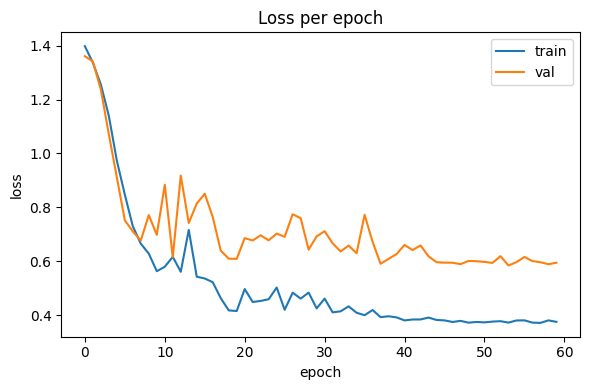

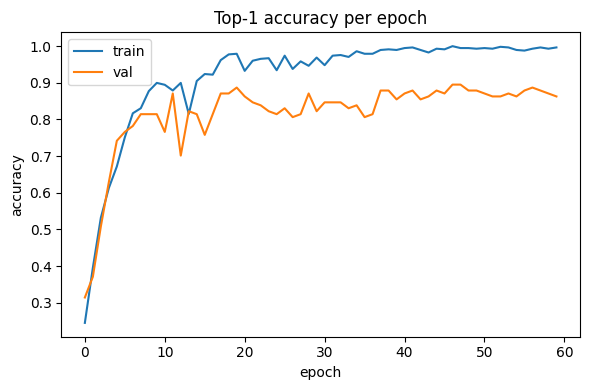

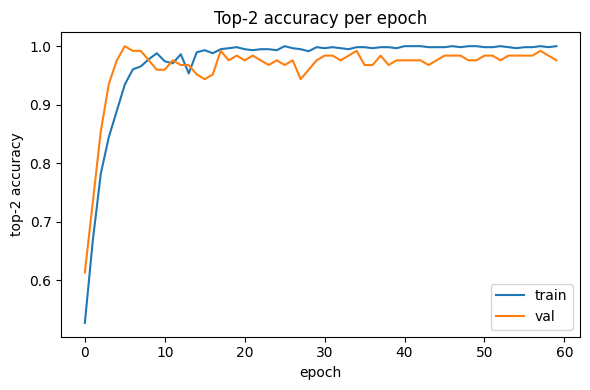

In [ ]:
# Loss
plt.figure(figsize=(6,4))
plt.plot(history_crop["train_loss"], label="train")
plt.plot(history_crop["val_loss"],   label="val")
plt.title("Loss per epoch"); plt.xlabel("epoch"); plt.ylabel("loss")
plt.legend(); plt.tight_layout(); plt.show()

# Accuracy (top-1)
plt.figure(figsize=(6,4))
plt.plot(history_crop["train_acc"], label="train")
plt.plot(history_crop["val_acc"],   label="val")
plt.title("Top-1 accuracy per epoch"); plt.xlabel("epoch"); plt.ylabel("accuracy")
plt.legend(); plt.tight_layout(); plt.show()

# Top-2
plt.figure(figsize=(6,4))
plt.plot(history_crop["train_top2"], label="train")
plt.plot(history_crop["val_top2"],   label="val")
plt.title("Top-2 accuracy per epoch"); plt.xlabel("epoch"); plt.ylabel("top-2 accuracy")
plt.legend(); plt.tight_layout(); plt.show()

# LR schedule across batches (OneCycle)
if history_crop["lrs"]:
    plt.figure(figsize=(6,3))
    plt.plot(history_crop["lrs"])
    plt.title("Learning rate (per batch)"); plt.xlabel("batch"); plt.ylabel("lr")
    plt.tight_layout(); plt.show()


* Tiempo de entrenamiento: 6 minutos
* GPU: A100

## Evaluación

In [ ]:
import torch, numpy as np
from sklearn.metrics import classification_report, confusion_matrix

# 0) Carga el mejor modelo
model.load_state_dict(torch.load("/content/best.pt", map_location=device))
model.to(device).eval()

criterion = torch.nn.CrossEntropyLoss()

all_logits, all_targets = [], []
test_loss, top1_sum, top2_sum, total = 0.0, 0.0, 0.0, 0

with torch.no_grad(), torch.cuda.amp.autocast(enabled=torch.cuda.is_available()):
    for xb, yb in dl_test:   # dl_test debe entregar tensores normalizados igual que train/val
        xb = xb.to(device, non_blocking=True)    # yb se queda en CPU; está bien para sklearn
        logits = model(xb)                       # (B, C)

        # acumular para métricas globales
        all_logits.append(logits.cpu())
        all_targets.append(yb)

        # loss y top-k
        loss = criterion(logits.cpu(), yb)       # logits a CPU para usar el mismo yb
        test_loss += loss.item() * xb.size(0)
        preds_top1 = logits.argmax(dim=1).cpu()
        top1_sum += (preds_top1 == yb).float().sum().item()
        _, top2 = logits.topk(2, dim=1)          # en device
        top2 = top2.cpu()
        top2_sum += (top2.eq(yb.view(-1,1))).any(dim=1).float().sum().item()
        total += xb.size(0)

logits = torch.cat(all_logits)              # (N, C) en CPU
y_pred = logits.argmax(1).numpy()
y_true = torch.cat(all_targets).numpy()
y_prob = torch.softmax(logits, dim=1).numpy()

print({
    "loss": test_loss/total,
    "acc":  top1_sum/total,
    "top2": top2_sum/total,
})

target_names = ["Normal","ASD","PDA","VSD"]

print(classification_report(y_true, y_pred, target_names=target_names, digits=4))
print(confusion_matrix(y_true, y_pred))


/tmp/ipython-input-1496934886.py:13: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.no_grad(), torch.cuda.amp.autocast(enabled=torch.cuda.is_available()):


{'loss': 0.42621484375, 'acc': 0.872, 'top2': 0.944}
              precision    recall  f1-score   support

      Normal     0.7895    0.9375    0.8571        32
         ASD     0.9500    0.6552    0.7755        29
         PDA     0.8611    0.9394    0.8986        33
         VSD     0.9355    0.9355    0.9355        31

    accuracy                         0.8720       125
   macro avg     0.8840    0.8669    0.8667       125
weighted avg     0.8818    0.8720    0.8686       125

[[30  1  0  1]
 [ 7 19  3  0]
 [ 1  0 31  1]
 [ 0  0  2 29]]


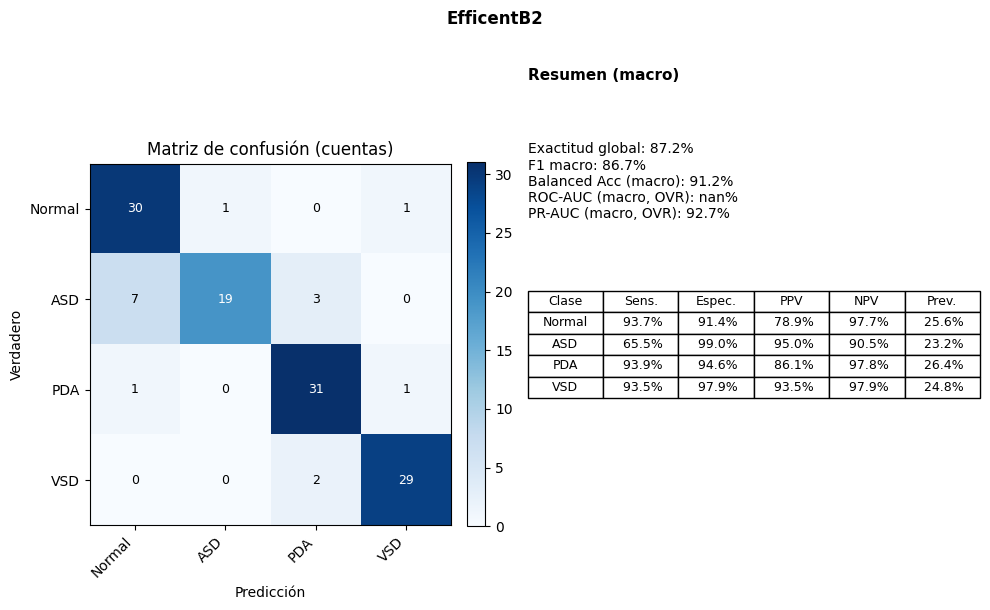

In [ ]:
metrics, fig = eval_multiclase(y_true, y_pred, y_prob, target_names, titulo="EfficentB2")

# Entrenamiento ResNet50

## Implementacion y entrenamiento

In [ ]:
# --- Configuración Principal ---
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
BATCH_SIZE = 64
EPOCHS = 60
LR = 5e-4
WEIGHT_DECAY = 1e-4
LABEL_SMOOTHING = 0.1
NUM_WORKERS = os.cpu_count() // 2 if torch.cuda.is_available() else 0

print(f"Device: {DEVICE}")
print(f"Num Workers: {NUM_WORKERS}")


num_classes = Y_train_encoded.shape[1]
y_train_idx = Y_train_encoded.argmax(1).astype(np.int64)
y_val_idx   = Y_val_encoded.argmax(1).astype(np.int64)
y_test_idx  = Y_test_encoded.argmax(1).astype(np.int64)

def chan_stats(x):
    m = float(x.mean()); s = float(x.std() + 1e-8)
    return m, s
mean_tr, std_tr = chan_stats(X_train_normalized[..., 0])
print(f"Dataset norm: mean={mean_tr:.4f}, std={std_tr:.4f}")

X_train_uint8 = (X_train_normalized * 255).astype(np.uint8)
X_val_uint8 = (X_val_normalized * 255).astype(np.uint8)
X_test_uint8 = (X_test_normalized * 255).astype(np.uint8)


resnet_weights = ResNet50_Weights.IMAGENET1K_V2
model_preprocess = resnet_weights.transforms()
print(f"Transformaciones del modelo: {model_preprocess}")

train_transforms = transforms.Compose([
    transforms.ToPILImage(),
    # NO convertimos a 3 canales. ToPILImage() lo manejará como (L)
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomAffine(degrees=10, translate=(0.05, 0.05)),

    # Convertimos a Tensor y Normalizamos nosotros mismos
    transforms.ToTensor(), # -> (1, H, W) en rango [0, 1]
    transforms.Normalize(mean=[mean_tr], std=[std_tr])
])

val_test_transforms = transforms.Compose([
    transforms.ToPILImage(),
    transforms.ToTensor(), # -> (1, H, W) en rango [0, 1]
    transforms.Normalize(mean=[mean_tr], std=[std_tr])
])


# --- Dataset y DataLoaders ---
class NumpyGrayDataset(Dataset):
    def __init__(self, x_nhwc, y_idx, transform=None):
        self.x = x_nhwc.astype(np.uint8)      # (N,H,W,1) en 0-255
        self.y = y_idx.astype(np.int64)
        self.transform = transform

    def __len__(self): return self.x.shape[0]

    def __getitem__(self, i):
        img = self.x[i]                        # (H,W,1)
        if self.transform is not None:
            img = self.transform(img)          # -> (3,224,224) float normalizado
        else:
            img = torch.from_numpy(np.transpose(img, (2,0,1))).float() / 255.0
            img = img.repeat(3, 1, 1)
        return img, self.y[i]


train_dataset = NumpyGrayDataset(X_train_uint8, y_train_idx, transform=train_transforms)
val_dataset = NumpyGrayDataset(X_val_uint8, y_val_idx, transform=val_test_transforms)
test_dataset = NumpyGrayDataset(X_test_uint8, y_test_idx, transform=val_test_transforms)

dl_train = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS, pin_memory=True)
dl_val = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
dl_test = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)


# --- Definición del Modelo ---
class ResNetClassifier(nn.Module):
    def __init__(self, num_classes, pretrained=True):
        super().__init__()
        weights = resnet_weights if pretrained else None
        m = models.resnet50(weights=weights)
        original_weights = m.conv1.weight.clone()

        m.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)

        if pretrained:
            m.conv1.weight.data = original_weights.mean(dim=1, keepdim=True)

        in_feats = m.fc.in_features
        m.fc = nn.Linear(in_feats, num_classes)

        self.net = m

    def forward(self, x):
        return self.net(x)

model = ResNetClassifier(num_classes).to(DEVICE)


# --- Funciones de Entrenamiento y Métricas ---
criterion = nn.CrossEntropyLoss(label_smoothing=LABEL_SMOOTHING)
optimizer = AdamW(model.parameters(), lr=LR, weight_decay=WEIGHT_DECAY)
steps_per_epoch = len(dl_train)
scheduler = OneCycleLR(optimizer, max_lr=LR, epochs=EPOCHS, steps_per_epoch=steps_per_epoch, pct_start=0.2)
scaler = GradScaler(enabled=torch.cuda.is_available())

def topk_acc(logits, y, k=1):
    _, pred = logits.topk(k, 1, True, True)
    return (pred.eq(y.view(-1,1)).any(1).float().mean().item())

def run_epoch(loader, train=True):
    model.train(train) # Poner modelo en modo train/eval
    total_loss = total = a1 = a2 = 0.0

    for xb, yb in loader:
        xb, yb = xb.to(DEVICE, non_blocking=True), yb.to(DEVICE, non_blocking=True)

        if train:
            optimizer.zero_grad(set_to_none=True)
            with autocast(enabled=torch.cuda.is_available()):
                logits = model(xb)
                loss = criterion(logits, yb)

            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
            scheduler.step() # El scheduler de OneCycle se actualiza cada batch
        else:
            with torch.no_grad(), autocast(enabled=torch.cuda.is_available()):
                logits = model(xb)
                loss = criterion(logits, yb)

        bs = xb.size(0)
        total_loss += loss.item()*bs
        total += bs
        a1 += topk_acc(logits, yb, 1)*bs
        a2 += topk_acc(logits, yb, 2)*bs

    return total_loss/total, a1/total, a2/total


best_val = float('inf')
history = defaultdict(list)

print("Iniciando entrenamiento...")
for ep in range(1, EPOCHS + 1):
    tr_loss, tr_a1, tr_a2 = run_epoch(dl_train, train=True)
    va_loss, va_a1, va_a2 = run_epoch(dl_val,   train=False)

    history["train_loss"].append(tr_loss); history["train_acc"].append(tr_a1); history["train_top2"].append(tr_a2)
    history["val_loss"].append(va_loss);   history["val_acc"].append(va_a1);   history["val_top2"].append(va_a2)

    print(f"Epoch {ep:02d} | train {tr_loss:.4f} acc {tr_a1:.3f} top2 {tr_a2:.3f} "
          f"| val {va_loss:.4f} acc {va_a1:.3f} top2 {va_a2:.3f} "
          f"| lr {optimizer.param_groups[0]['lr']:.2e}")

    if va_loss < best_val - 1e-4:
        best_val = va_loss
        torch.save(model.state_dict(), "best_model_resnet50.pt")
        print(f"  -> Nuevo mejor modelo guardado en 'best_model_resnet50.pt' (val_loss: {best_val:.4f})")

# Guardar el modelo final
torch.save(model.state_dict(), "last_model_resnet50.pt")
print("Entrenamiento finalizado. Último modelo guardado en 'last_model_resnet50.pt'")

Device: cuda
Num Workers: 1
Dataset norm: mean=0.6007, std=0.1668
Transformaciones del modelo: ImageClassification(
    crop_size=[224]
    resize_size=[232]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BILINEAR
)
Iniciando entrenamiento...


/tmp/ipython-input-2919690445.py:109: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler(enabled=torch.cuda.is_available())
/tmp/ipython-input-2919690445.py:124: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=torch.cuda.is_available()):
/usr/local/lib/python3.12/dist-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(
/tmp/ipython-input-2919690445.py:133: FutureWarning: `torch.cuda.amp.autocast(args...

Epoch 01 | train 1.3902 acc 0.273 top2 0.501 | val 1.3944 acc 0.161 top2 0.363 | lr 2.83e-05
  -> Nuevo mejor modelo guardado en 'best_model_resnet50.pt' (val_loss: 1.3944)
Epoch 02 | train 1.3369 acc 0.458 top2 0.712 | val 1.3713 acc 0.339 top2 0.597 | lr 5.27e-05
  -> Nuevo mejor modelo guardado en 'best_model_resnet50.pt' (val_loss: 1.3713)
Epoch 03 | train 1.2566 acc 0.577 top2 0.808 | val 1.3337 acc 0.460 top2 0.710 | lr 9.14e-05
  -> Nuevo mejor modelo guardado en 'best_model_resnet50.pt' (val_loss: 1.3337)
Epoch 04 | train 1.1225 acc 0.634 top2 0.867 | val 1.2575 acc 0.508 top2 0.790 | lr 1.42e-04
  -> Nuevo mejor modelo guardado en 'best_model_resnet50.pt' (val_loss: 1.2575)
Epoch 05 | train 0.9382 acc 0.712 top2 0.926 | val 1.1252 acc 0.540 top2 0.815 | lr 2.00e-04
  -> Nuevo mejor modelo guardado en 'best_model_resnet50.pt' (val_loss: 1.1252)
Epoch 06 | train 0.8007 acc 0.743 top2 0.940 | val 0.9953 acc 0.613 top2 0.927 | lr 2.63e-04
  -> Nuevo mejor modelo guardado en 'best_

## Desempeño en entrenamiento

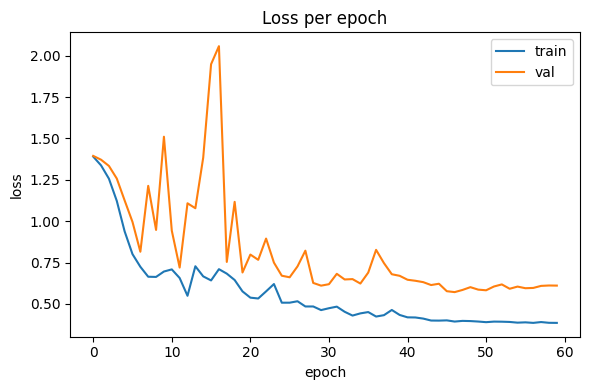

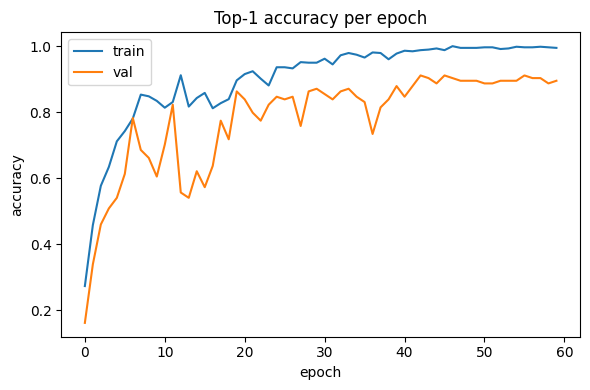

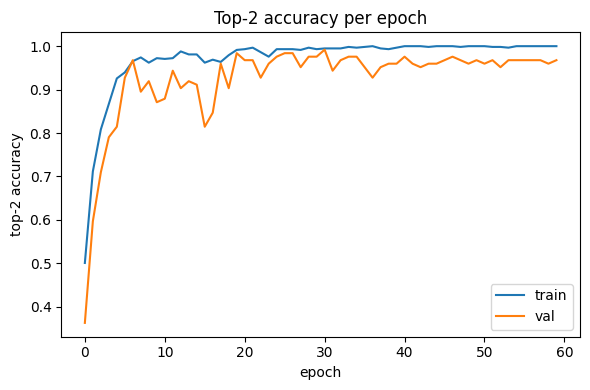

In [ ]:
# Loss
plt.figure(figsize=(6,4))
plt.plot(history["train_loss"], label="train")
plt.plot(history["val_loss"],   label="val")
plt.title("Loss per epoch"); plt.xlabel("epoch"); plt.ylabel("loss")
plt.legend(); plt.tight_layout(); plt.show()

# Accuracy (top-1)
plt.figure(figsize=(6,4))
plt.plot(history["train_acc"], label="train")
plt.plot(history["val_acc"],   label="val")
plt.title("Top-1 accuracy per epoch"); plt.xlabel("epoch"); plt.ylabel("accuracy")
plt.legend(); plt.tight_layout(); plt.show()

# Top-2
plt.figure(figsize=(6,4))
plt.plot(history["train_top2"], label="train")
plt.plot(history["val_top2"],   label="val")
plt.title("Top-2 accuracy per epoch"); plt.xlabel("epoch"); plt.ylabel("top-2 accuracy")
plt.legend(); plt.tight_layout(); plt.show()

# LR schedule across batches (OneCycle)
if history["lrs"]:
    plt.figure(figsize=(6,3))
    plt.plot(history["lrs"])
    plt.title("Learning rate (per batch)"); plt.xlabel("batch"); plt.ylabel("lr")
    plt.tight_layout(); plt.show()

* Tiempo de entrenamiento: 5.5 minutos
* GPU: A100

## Evaluación

In [ ]:
import torch, numpy as np
from sklearn.metrics import classification_report, confusion_matrix

# 0) Carga el mejor modelo
model.load_state_dict(torch.load("best_model_resnet50.pt", map_location=DEVICE))
model.to(DEVICE).eval()

criterion = torch.nn.CrossEntropyLoss()

all_logits, all_targets = [], []
test_loss, top1_sum, top2_sum, total = 0.0, 0.0, 0.0, 0

with torch.no_grad(), torch.cuda.amp.autocast(enabled=torch.cuda.is_available()):
    for xb, yb in dl_test:   # dl_test debe entregar tensores normalizados igual que train/val
        xb = xb.to(DEVICE, non_blocking=True)    # yb se queda en CPU; está bien para sklearn
        logits = model(xb)                       # (B, C)

        # acumular para métricas globales
        all_logits.append(logits.cpu())
        all_targets.append(yb)

        # loss y top-k
        loss = criterion(logits.cpu(), yb)       # logits a CPU para usar el mismo yb
        test_loss += loss.item() * xb.size(0)
        preds_top1 = logits.argmax(dim=1).cpu()
        top1_sum += (preds_top1 == yb).float().sum().item()
        _, top2 = logits.topk(2, dim=1)          # en device
        top2 = top2.cpu()
        top2_sum += (top2.eq(yb.view(-1,1))).any(dim=1).float().sum().item()
        total += xb.size(0)

logits = torch.cat(all_logits)              # (N, C) en CPU
y_pred = logits.argmax(1).numpy()
y_true = torch.cat(all_targets).numpy()
y_prob = torch.softmax(logits, dim=1).numpy()

print({
    "loss": test_loss/total,
    "acc":  top1_sum/total,
    "top2": top2_sum/total,
})

# Ajustar el orden/nombres según label encoder
target_names = ["Normal","ASD","PDA","VSD"]

print(classification_report(y_true, y_pred, target_names=target_names, digits=4))
print(confusion_matrix(y_true, y_pred))


/tmp/ipython-input-4263637262.py:13: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.no_grad(), torch.cuda.amp.autocast(enabled=torch.cuda.is_available()):


{'loss': 0.42966015625, 'acc': 0.872, 'top2': 0.96}
              precision    recall  f1-score   support

      Normal     0.8750    0.8750    0.8750        32
         ASD     0.7857    0.7586    0.7719        29
         PDA     0.9143    0.9697    0.9412        33
         VSD     0.9000    0.8710    0.8852        31

    accuracy                         0.8720       125
   macro avg     0.8687    0.8686    0.8683       125
weighted avg     0.8709    0.8720    0.8711       125

[[28  2  0  2]
 [ 4 22  2  1]
 [ 0  1 32  0]
 [ 0  3  1 27]]


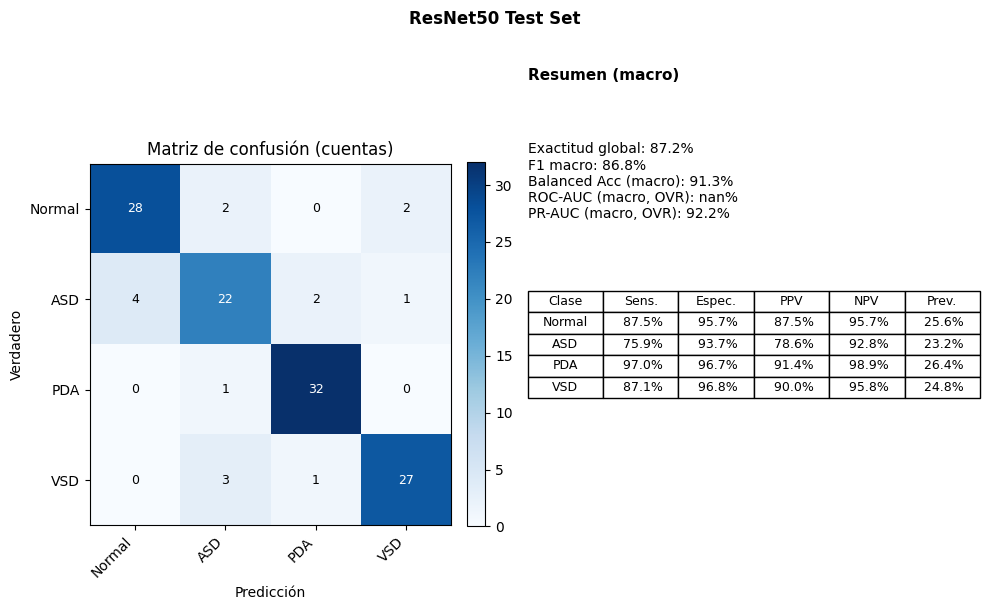

In [ ]:
metrics, fig = eval_multiclase(y_true, y_pred, y_prob, target_names, titulo="ResNet50 Test Set")

# Grad-CAM Modelos Individuales

Los mapas Grad-CAM del modelo ensamble permiten visualizar las regiones anatómicas que más influyen en la predicción final. En conjunto, revelan una atención más localizada, coherente con la anatomía cardiotorácica y con los patrones clínicos esperados para cada tipo de cardiopatía.

## Clases y funciones para grad-cam

In [ ]:
import torch, torch.nn as nn
from torchvision import models
from torch.utils.data import DataLoader
from torchvision import transforms
from sklearn.metrics import classification_report, confusion_matrix

if 'model' in locals():
    del model

# Importante: forzar al colector de basura después de borrar
import gc
gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Datos: X_*_normalized (N,320,320,1) en [0,1]; Y_*_encoded one-hot (N,4)
num_classes = Y_train_encoded.shape[1]
y_train_idx = Y_train_encoded.argmax(1).astype(np.int64)
y_val_idx   = Y_val_encoded.argmax(1).astype(np.int64)
y_test_idx  = Y_test_encoded.argmax(1).astype(np.int64)

resnet_weights = ResNet50_Weights.IMAGENET1K_V2

class EfficientNetGray(nn.Module):
    def __init__(self, num_classes, pretrained=True):
        super().__init__()
        weights = models.EfficientNet_B2_Weights.IMAGENET1K_V1 if pretrained else None
        m = models.efficientnet_b2(weights=weights)

        original_conv_weights = m.features[0][0].weight.clone()

        m.features[0][0] = nn.Conv2d(1, 32, kernel_size=3, stride=2, padding=1, bias=False)

        if pretrained:
            m.features[0][0].weight.data = original_conv_weights.mean(dim=1, keepdim=True)

        in_feats = m.classifier[1].in_features
        m.classifier = nn.Sequential(
            nn.Dropout(p=0.4, inplace=True),
            nn.Linear(in_feats, num_classes)
        )
        self.net = m

    def forward(self, x):
        return self.net(x)

class ResNetClassifier(nn.Module):
    def __init__(self, num_classes, pretrained=True):
        super().__init__()
        weights = resnet_weights if pretrained else None
        m = models.resnet50(weights=weights)
        original_weights = m.conv1.weight.clone()

        m.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)

        if pretrained:
            m.conv1.weight.data = original_weights.mean(dim=1, keepdim=True)

        in_feats = m.fc.in_features
        m.fc = nn.Linear(in_feats, num_classes)

        self.net = m

    def forward(self, x):
        return self.net(x)

GRAD-CAM helper y la capa objetivo (aplicarlo a la ultima capa de convolucion)

In [ ]:
import numpy as np
from torchvision import transforms

def chan_stats(x):
    x = x.astype(np.float32)
    m = float(x.mean())
    s = float(x.std() + 1e-8)
    return m, s

try:
    _arr_for_stats = X_train_normalized[..., 0]  # (N,H,W)
except NameError:
    _arr_for_stats = X_test_normalized[..., 0]   # fallback

mean_tr, std_tr = chan_stats(_arr_for_stats)
print(f"[Norm] mean={mean_tr:.4f}, std={std_tr:.4f}")

# === mismas transforms que en valid/test ===
val_test_transforms = transforms.Compose([
    transforms.ToPILImage(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[mean_tr], std=[std_tr])
])


[Norm] mean=0.6007, std=0.1668


In [ ]:
import torch
import torch.nn.functional as F

class SimpleGradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.model.eval()
        self.feats = {}
        self.h1 = target_layer.register_forward_hook(self._fwd_hook)
        self.h2 = target_layer.register_full_backward_hook(self._bwd_hook)

    def _fwd_hook(self, m, i, o):    # activaciones
        self.feats['acts'] = o.detach()
    def _bwd_hook(self, m, gin, gout):  # gradientes
        self.feats['grads'] = gout[0].detach()

    def remove(self):
        self.h1.remove(); self.h2.remove()

    def __call__(self, x, class_idx=None):
        # x: (1,1,H,W) ya normalizado como en valid/test
        self.model.zero_grad(set_to_none=True)
        logits = self.model(x)
        if class_idx is None:
            class_idx = int(logits.argmax(1).item())
        score = logits[0, class_idx]

        # backward sin autocast
        self.model.zero_grad(set_to_none=True)
        score.backward(retain_graph=True)

        A   = self.feats['acts'][0]            # (C,h,w)
        dA  = self.feats['grads'][0]           # (C,h,w)
        w   = dA.mean(dim=(1,2))               # (C,)
        cam = (w.view(-1,1,1) * A).sum(dim=0)  # (h,w)
        cam = F.relu(cam)

        # normaliza y reescala
        cam = cam - cam.min()
        cam = cam / (cam.max() + 1e-8)
        cam = F.interpolate(cam[None,None], size=x.shape[-2:], mode='bilinear', align_corners=False)
        return cam.cpu(), class_idx


In [ ]:
import os, numpy as np, torch
import matplotlib.pyplot as plt
import torch.nn.functional as F

class_names = ["Normal","ASD","PDA","VSD"]

def tensor_from_index(i):
    img_np = (X_test_normalized[i] * 255).astype(np.uint8)   # (H,W,1) en [0,255]
    x = val_test_transforms(img_np).unsqueeze(0).to(device)  # (1,1,H,W)
    y_true = int(y_test_idx[i])
    return x, y_true

# Grad-CAM para un índice dado (modo pred o forzar clase objetivo)
def gradcam_for_index(model, target_layer, i, force_class_idx=None):
    x, y_true = tensor_from_index(i)

    # logits y probas
    effnet_model.eval()
    with torch.no_grad():
        logits = effnet_model(x)
        probs = torch.softmax(logits, dim=1)[0].detach().cpu().numpy()
        pred_idx = int(logits.argmax(1).item())

    class_idx = force_class_idx if force_class_idx is not None else pred_idx

    # aplicar grad CAM  a 'class_idx'
    cam_extractor = SimpleGradCAM( model= model , target_layer= target_layer) # SimpleGradCAM(effnet_model, target_layer)
    cam, _ = cam_extractor(x, class_idx=class_idx)   # (1,1,H,W) en [0,1]
    cam_extractor.remove()

    return x, y_true, pred_idx, probs, cam


def show_and_save_overlay(x_1ch, cam_1ch, title, save_path=None):
    x_np = x_1ch[0,0].detach().cpu().float().numpy()
    x_disp = (x_np - x_np.min()) / (x_np.max() - x_np.min() + 1e-8)
    cam_np = cam_1ch[0,0].detach().cpu().numpy()

    plt.figure(figsize=(9,3))
    plt.subplot(1,3,1); plt.title("Imagen");  plt.imshow(x_disp, cmap='gray'); plt.axis('off')
    plt.subplot(1,3,2); plt.title("Grad-CAM"); plt.imshow(cam_np, cmap='jet'); plt.axis('off')
    plt.subplot(1,3,3); plt.title("Overlay");
    plt.imshow(x_disp, cmap='gray'); plt.imshow(cam_np, cmap='jet', alpha=0.45); plt.axis('off')
    plt.suptitle(title); plt.tight_layout()

    if save_path:
        os.makedirs(os.path.dirname(save_path), exist_ok=True)
        plt.savefig(save_path, dpi=200, bbox_inches='tight')
    plt.show()
    plt.close()

def gradcam_examples_by_class(model, target_layer, k_per_class=3, mode="pred", save_dir="gradcam_by_class"):
    """
    mode:
      - "pred": CAM de la clase PREDICHA.
      - "true": CAM forzando la clase VERDADERA (útil para inspección dirigida).
    """
    np.random.seed(42)
    total = len(y_test_idx)
    for c in range(len(class_names)):
        idxs = np.where(y_test_idx == c)[0]
        if len(idxs) == 0:
            print(f"[{class_names[c]}] sin ejemplos en test.")
            continue
        # Muestra aleatoria (o toma los primeros si hay pocos)
        sel = idxs if len(idxs) <= k_per_class else np.random.choice(idxs, size=k_per_class, replace=False)
        print(f"\n=== Clase verdadera: {class_names[c]} (n={len(idxs)}) | mostrando {len(sel)} ===")

        for i in sel:
            if mode == "true":
                force_cls = c
            else:  # "pred"
                force_cls = None

            x, y_true, y_pred, probs, cam = gradcam_for_index(model, target_layer, i, force_class_idx=force_cls)
            used_idx = (c if mode == "true" else y_pred)
            title = f"True: {class_names[y_true]} | CAM→ {class_names[used_idx]} | Pred: {class_names[y_pred]} ({probs[y_pred]:.2f}) | idx={i}"

            save_path = os.path.join(save_dir, class_names[y_true], f"idx{i}_CAM-{class_names[used_idx]}_PRED-{class_names[y_pred]}.png")
            show_and_save_overlay(x, cam, title=title, save_path=save_path)


def gradcam_examples_by_class_resnet(model, target_layer, k_per_class=3, mode="pred", save_dir="gradcam_by_class_resnet"):
    np.random.seed(42)
    for c in range(len(class_names)):
        idxs = np.where(y_test_idx == c)[0]
        if len(idxs) == 0:
            print(f"[{class_names[c]}] sin ejemplos en test.")
            continue
        sel = idxs if len(idxs) <= k_per_class else np.random.choice(idxs, size=k_per_class, replace=False)
        print(f"\n=== Clase verdadera: {class_names[c]} (n={len(idxs)}) | mostrando {len(sel)} ===")

        for i in sel:
            # prepara tensor
            img_np = (X_test_normalized[i] * 255).astype(np.uint8)
            x = val_test_transforms(img_np).unsqueeze(0).to(device)
            y_true = int(y_test_idx[i])

            # logits y pred
            model.eval()
            with torch.no_grad():
                logits = model(x)
                probs = torch.softmax(logits, dim=1)[0].detach().cpu().numpy()
                y_pred = int(logits.argmax(1).item())

            used_idx = (c if mode == "true" else y_pred)

            # CAM de ResNet50
            cam_extractor = SimpleGradCAM(model, target_layer_resnet)
            cam, _ = cam_extractor(x, class_idx=used_idx)
            cam_extractor.remove()

            title = f"ResNet50 | True: {class_names[y_true]} | CAM→ {class_names[used_idx]} | Pred: {class_names[y_pred]} ({probs[y_pred]:.2f}) | idx={i}"
            save_path = os.path.join(save_dir, class_names[y_true], f"idx{i}_CAM-{class_names[used_idx]}_PRED-{class_names[y_pred]}.png")
            show_and_save_overlay(x, cam, title=title, save_path=save_path)



## Grad-CAM - EfficentNetb2

### Carga del modelo

In [ ]:
# === Carga SOLO EfficientNet-B2 ===
effnet_model = EfficientNetGray(num_classes=num_classes, pretrained=False).to(device)

try:
    effnet_model.load_state_dict(torch.load(
        "/content/drive/MyDrive/CARDIOS - PROYECTO INTEGRADOR/Modelos/best_model_efficient_net.pt",
        map_location=device
    ))
    print("EfficientNet-B2 cargado OK")
except Exception as e:
    print("Error cargando EfficientNet-B2:", e)

effnet_model.eval()


EfficientNet-B2 cargado OK


EfficientNetGray(
  (net): EfficientNet(
    (features): Sequential(
      (0): Conv2dNormActivation(
        (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): SiLU(inplace=True)
      )
      (1): Sequential(
        (0): MBConv(
          (block): Sequential(
            (0): Conv2dNormActivation(
              (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
              (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
              (2): SiLU(inplace=True)
            )
            (1): SqueezeExcitation(
              (avgpool): AdaptiveAvgPool2d(output_size=1)
              (fc1): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
              (fc2): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
              (activation): SiLU(inplace=True)
              (scale_

### Ejecucion GradCAM

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
effnet_model.eval()  # se necesita de tener ya cargado el modelo ya sea EfficientNet-B2 o resnet50

# Última conv del último bloque de EfficientNet-B2 o ResNet50
target_layer = effnet_model.net.features[-1][0]  # Conv2d dentro de ConvNormActivation

GradCAM dada la clase predicha


=== Clase verdadera: Normal (n=32) | mostrando 3 ===


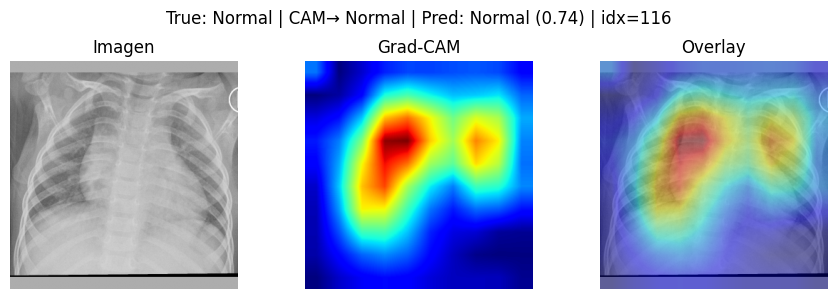

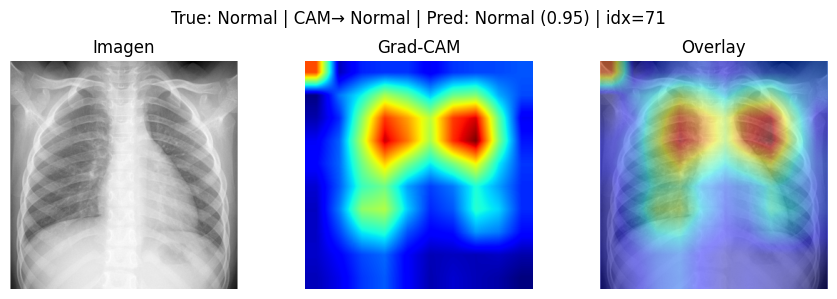

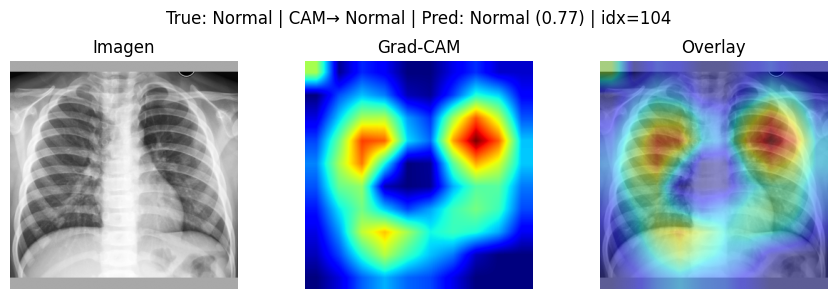


=== Clase verdadera: ASD (n=29) | mostrando 3 ===


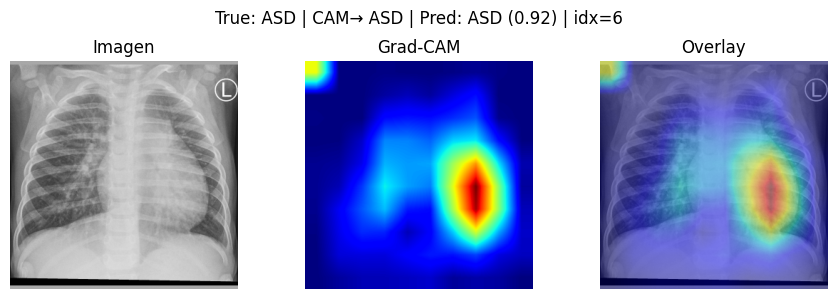

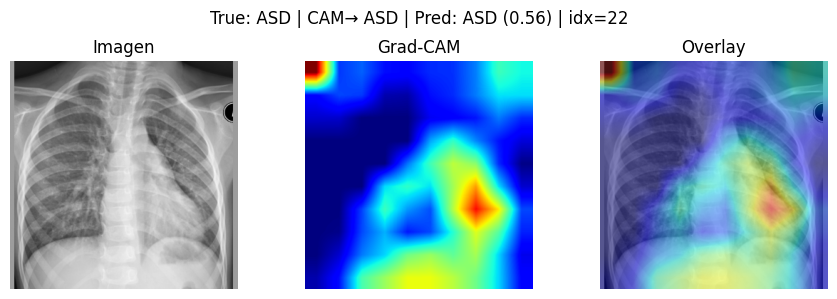

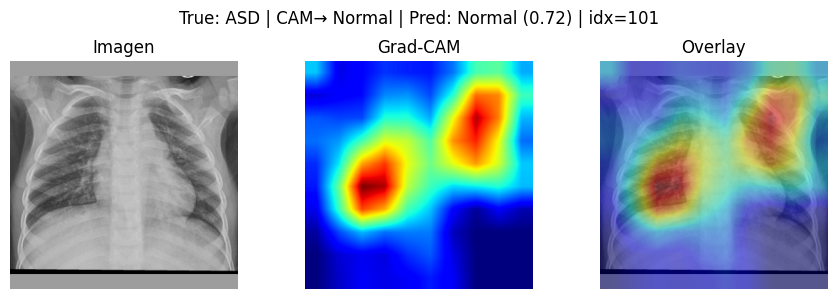


=== Clase verdadera: PDA (n=33) | mostrando 3 ===


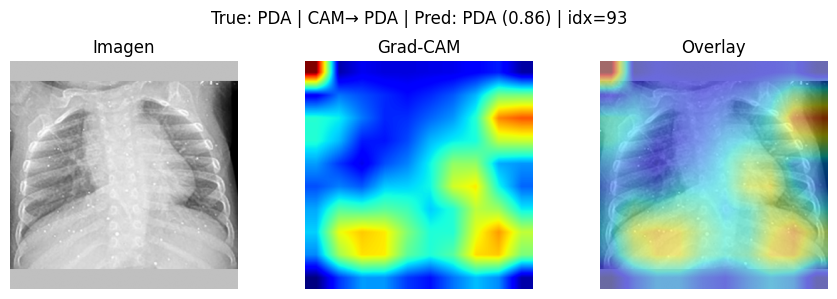

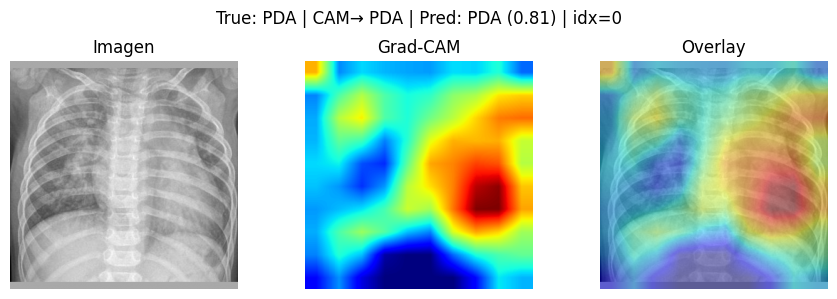

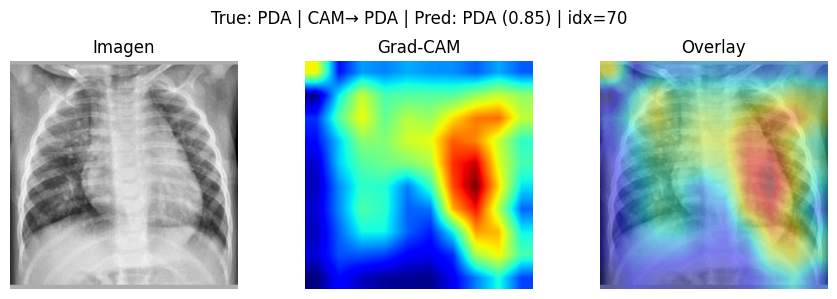


=== Clase verdadera: VSD (n=31) | mostrando 3 ===


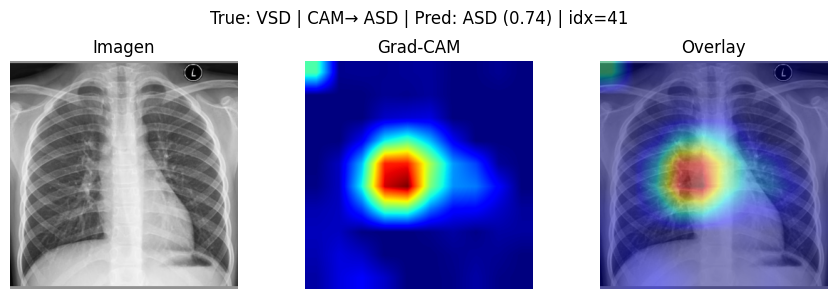

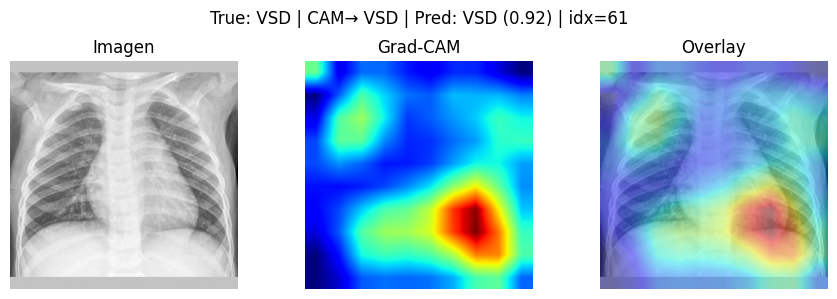

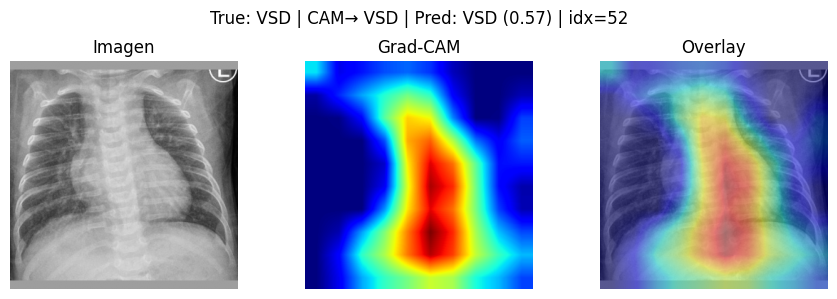

In [ ]:
# Aplicar gradcam dada la clase predecida
gradcam_examples_by_class(effnet_model, target_layer, k_per_class=3, mode="pred", save_dir="gradcam_by_class")

GradCAM aplicando a la clase verdadera - Analisis para las clases con menor recall  como ASD


=== Clase verdadera: Normal (n=32) | mostrando 3 ===


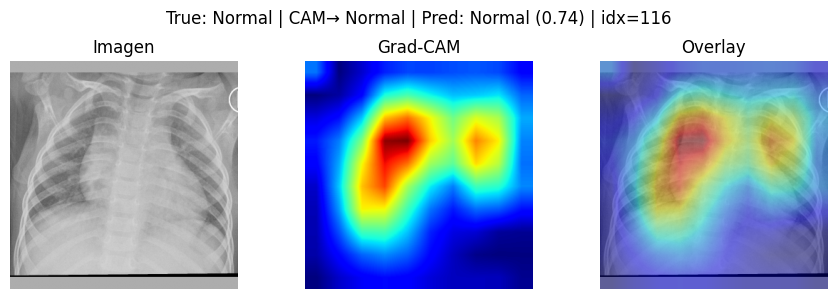

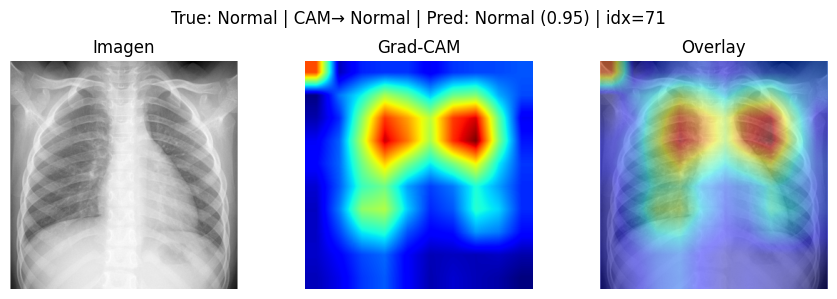

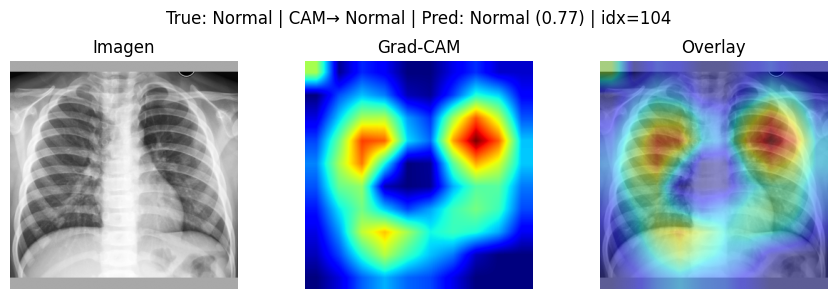


=== Clase verdadera: ASD (n=29) | mostrando 3 ===


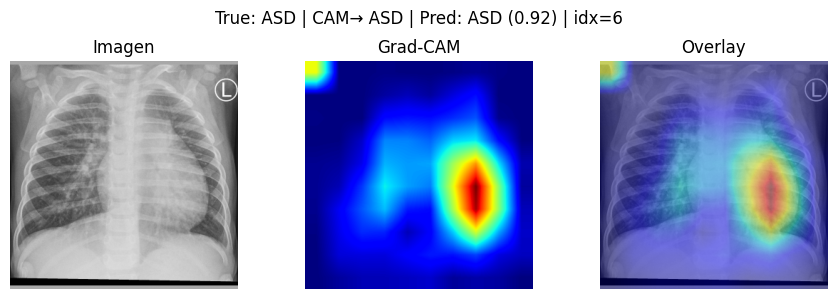

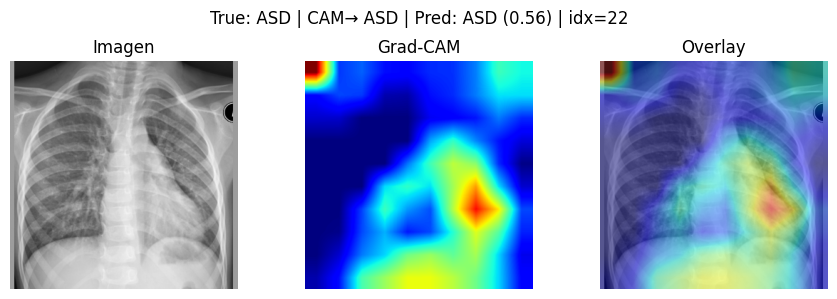

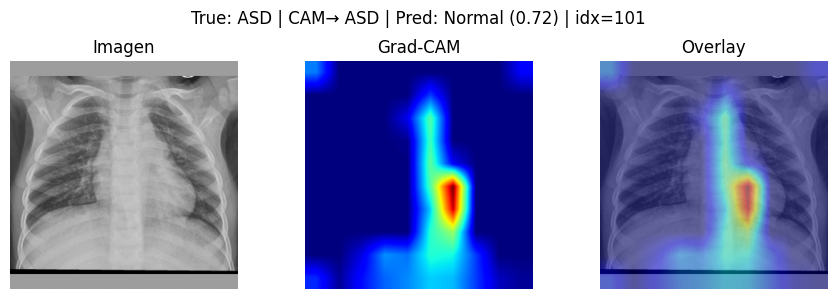


=== Clase verdadera: PDA (n=33) | mostrando 3 ===


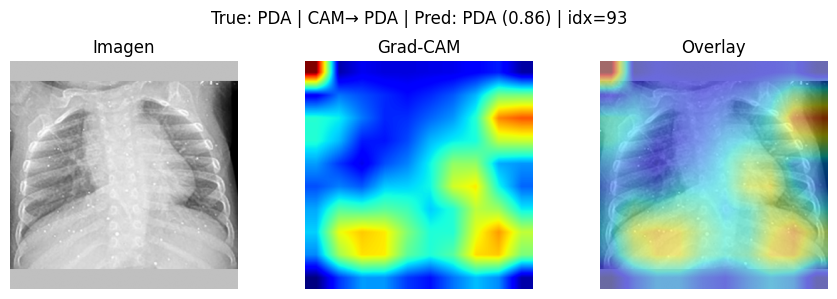

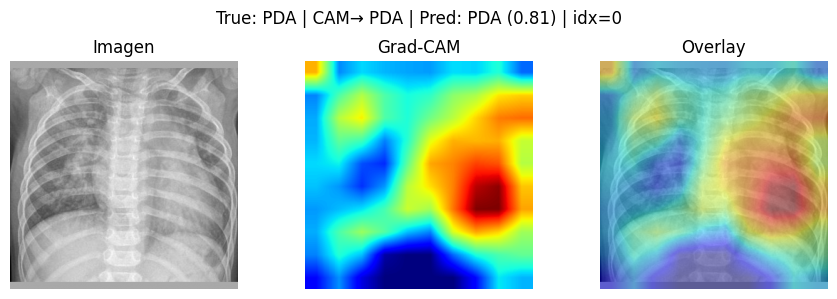

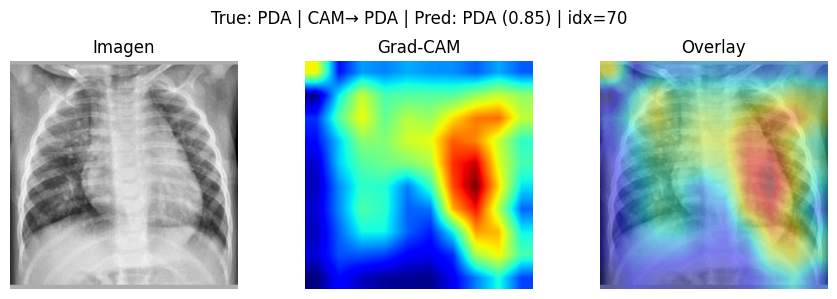


=== Clase verdadera: VSD (n=31) | mostrando 3 ===


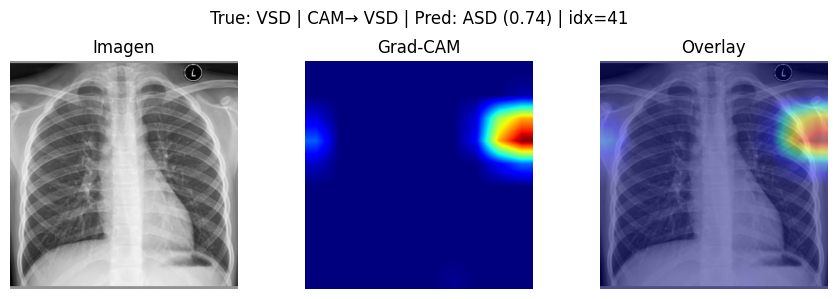

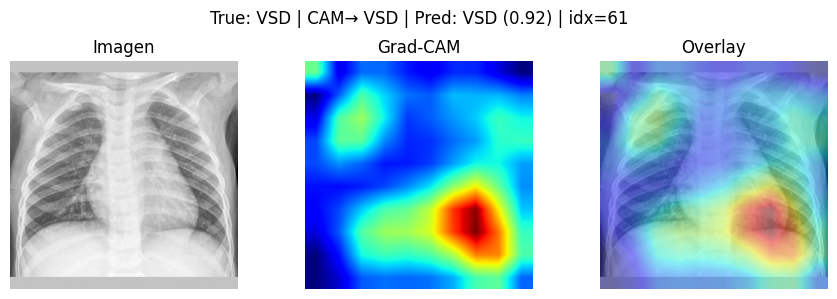

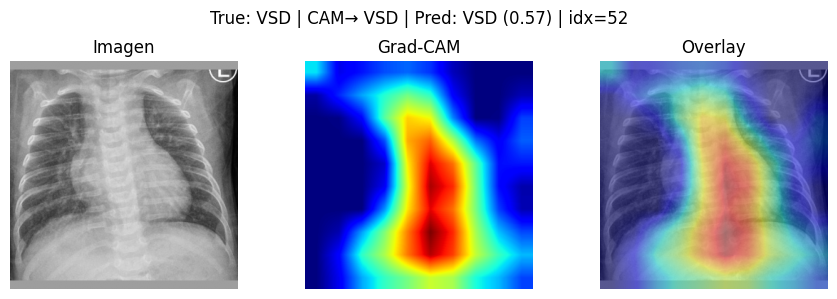

In [ ]:
# Ejecutar también forzando CAM a la clase VERDADERA (útil para ASD):
gradcam_examples_by_class(k_per_class=3, mode="true", save_dir="gradcam_by_class_trueCAM")

## Grad-CAM - ResNet50

### Carga del modelo

In [ ]:
# Load de solo un canal de ResNet50 (gris, 1 canal)
resnet_model = ResNetClassifier(num_classes=num_classes, pretrained=False).to(device)

try:
    resnet_model.load_state_dict(torch.load(
        "/content/drive/MyDrive/CARDIOS - PROYECTO INTEGRADOR/Modelos/best_model_resnet50.pt",
        map_location=device
    ))
    print("ResNet50 cargado OK")
except Exception as e:
    print("Error cargando ResNet50:", e)

resnet_model.eval()

ResNet50 cargado OK


ResNetClassifier(
  (net): ResNet(
    (conv1): Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
     

### Ejecucion GradCAM

In [ ]:
# Capa objetivo para Grad-CAM (última conv del último bottleneck)
target_layer_resnet = resnet_model.net.layer4[-1].conv3


=== Clase verdadera: Normal (n=32) | mostrando 3 ===


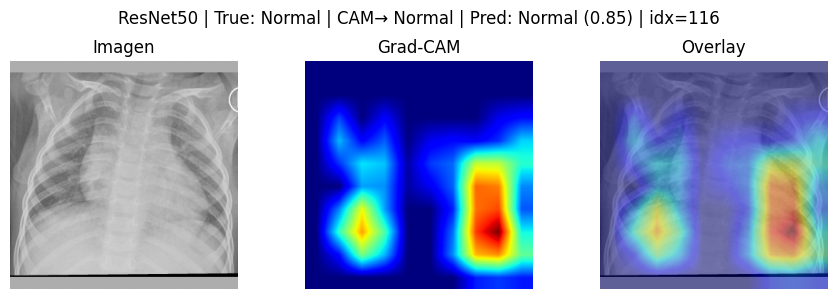

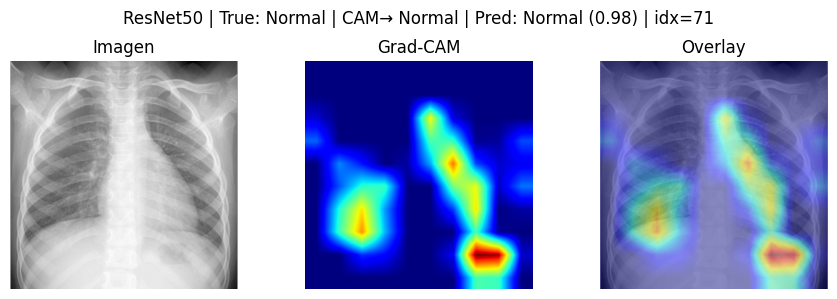

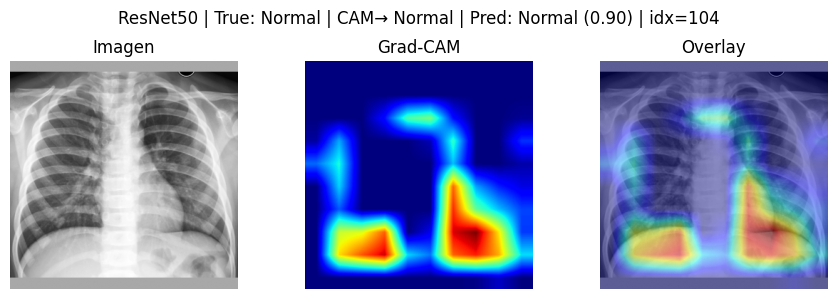


=== Clase verdadera: ASD (n=29) | mostrando 3 ===


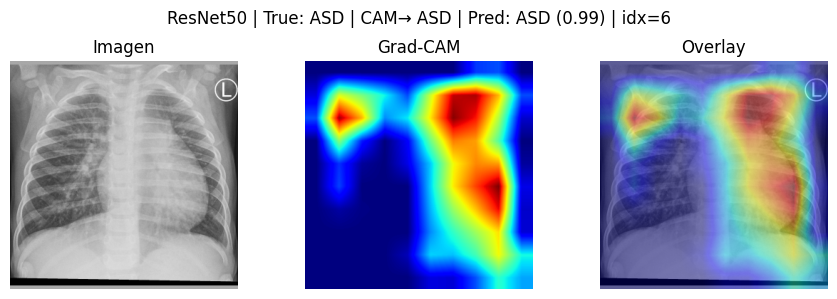

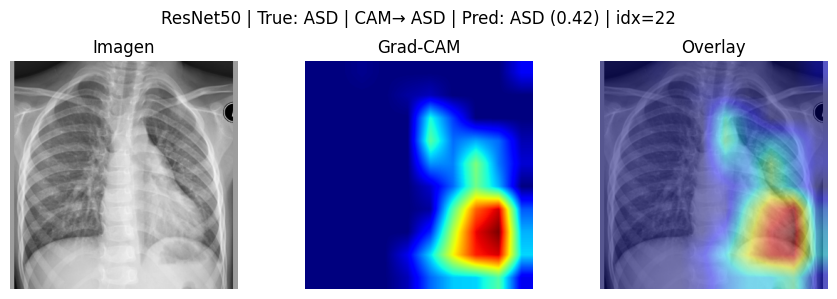

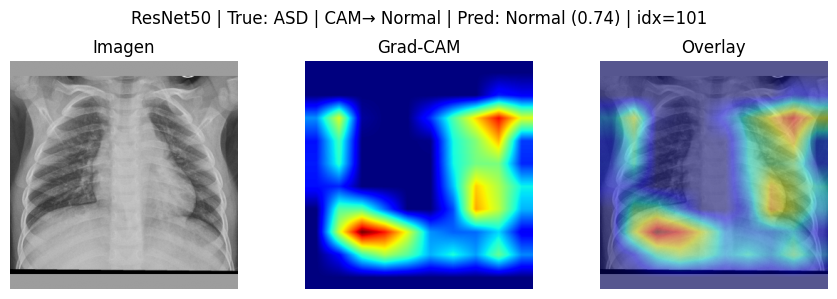


=== Clase verdadera: PDA (n=33) | mostrando 3 ===


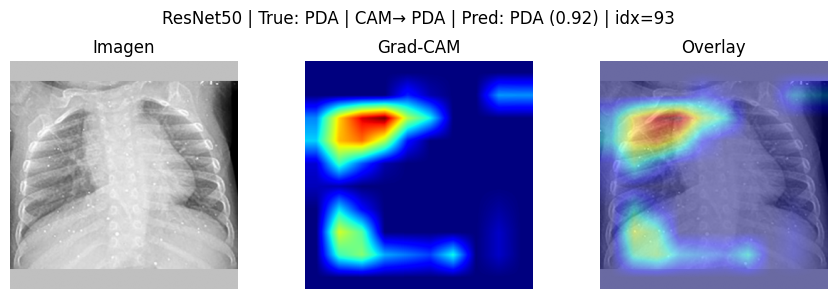

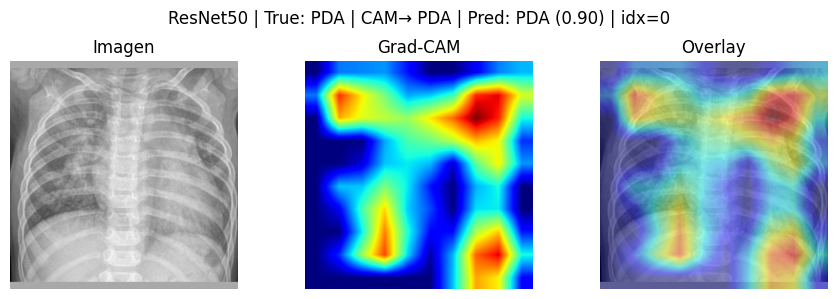

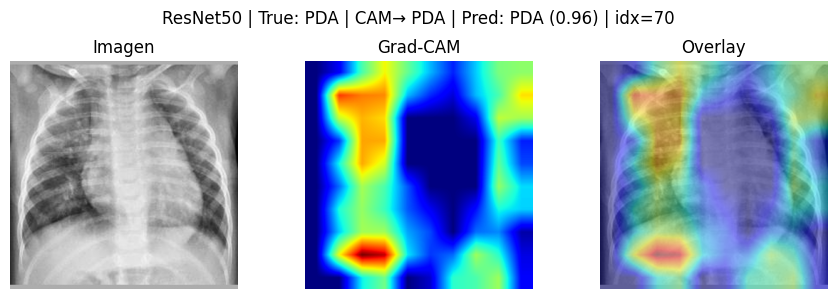


=== Clase verdadera: VSD (n=31) | mostrando 3 ===


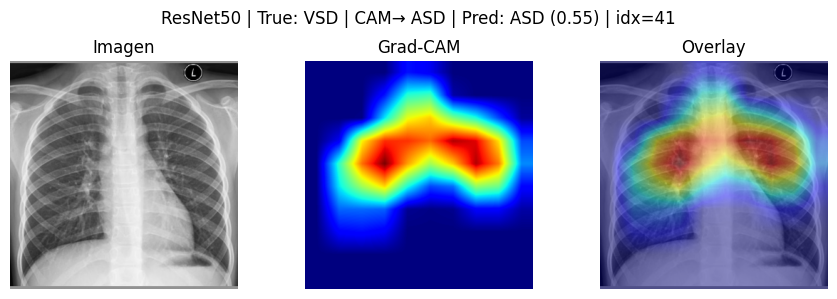

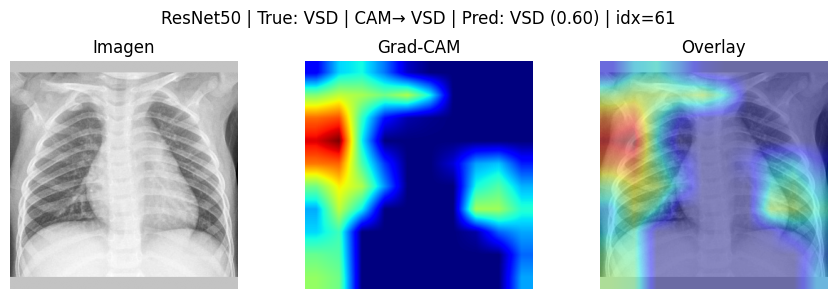

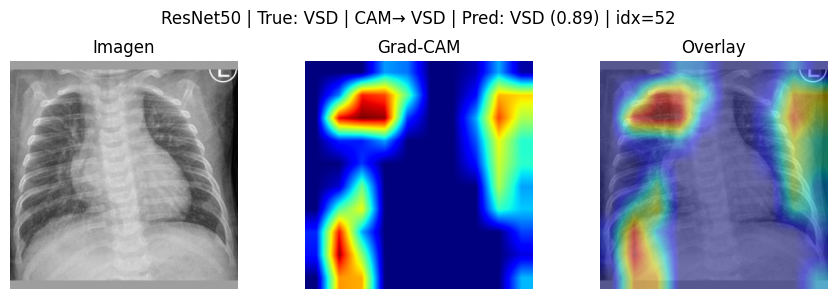

In [ ]:
# Ejecuta para la clase predicha
gradcam_examples_by_class_resnet(model=resnet_model, target_layer= target_layer_resnet, k_per_class=3, mode="pred", save_dir="gradcam_by_class_resnet")

# Ensamble Simple EfficientNetB2 y ResNet50

In [ ]:
import torch, torch.nn as nn
from torchvision import models
from torch.utils.data import DataLoader
from torchvision import transforms
from sklearn.metrics import classification_report, confusion_matrix

if 'model' in locals():
    del model

# Importante: forzar al colector de basura después de borrar
import gc
gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Datos: X_*_normalized (N,320,320,1) en [0,1]; Y_*_encoded one-hot (N,4)
num_classes = Y_train_encoded.shape[1]
y_train_idx = Y_train_encoded.argmax(1).astype(np.int64)
y_val_idx   = Y_val_encoded.argmax(1).astype(np.int64)
y_test_idx  = Y_test_encoded.argmax(1).astype(np.int64)

resnet_weights = ResNet50_Weights.IMAGENET1K_V2

class EfficientNetGray(nn.Module):
    def __init__(self, num_classes, pretrained=True):
        super().__init__()
        weights = models.EfficientNet_B2_Weights.IMAGENET1K_V1 if pretrained else None
        m = models.efficientnet_b2(weights=weights)

        original_conv_weights = m.features[0][0].weight.clone()

        m.features[0][0] = nn.Conv2d(1, 32, kernel_size=3, stride=2, padding=1, bias=False)

        if pretrained:
            m.features[0][0].weight.data = original_conv_weights.mean(dim=1, keepdim=True)

        in_feats = m.classifier[1].in_features
        m.classifier = nn.Sequential(
            nn.Dropout(p=0.4, inplace=True),
            nn.Linear(in_feats, num_classes)
        )
        self.net = m

    def forward(self, x):
        return self.net(x)

class ResNetClassifier(nn.Module):
    def __init__(self, num_classes, pretrained=True):
        super().__init__()
        weights = resnet_weights if pretrained else None
        m = models.resnet50(weights=weights)
        original_weights = m.conv1.weight.clone()

        m.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)

        if pretrained:
            m.conv1.weight.data = original_weights.mean(dim=1, keepdim=True)

        in_feats = m.fc.in_features
        m.fc = nn.Linear(in_feats, num_classes)

        self.net = m

    def forward(self, x):
        return self.net(x)

## Cargamos los modelos


In [ ]:

effnet_model = EfficientNetGray(num_classes=num_classes, pretrained=False).to(device)
resnet_model = ResNetClassifier(num_classes=num_classes, pretrained=False).to(device)

try:
    effnet_model.load_state_dict(torch.load("/content/drive/MyDrive/CARDIOS - PROYECTO INTEGRADOR/Modelos/best_model_efficient_net.pt"))
    resnet_model.load_state_dict(torch.load("/content/drive/MyDrive/CARDIOS - PROYECTO INTEGRADOR/Modelos/best_model_resnet50.pt"))
except Exception as e:
    print(f"Error cargando modelos: {e}")
    print("Asegúrate de que 'num_classes' sea correcto y los archivos .pt existan.")

effnet_model.eval()
resnet_model.eval()

print("Modelos EfficientNet y ResNet50 cargados y en modo .eval()")

Modelos EfficientNet y ResNet50 cargados y en modo .eval()


## Evaluación del modelo

In [ ]:
class NumpyGrayDataset(Dataset):
    def __init__(self, x_nhwc, y_idx, transform=None):
        self.x = x_nhwc.astype(np.uint8)      # (N,H,W,1) en 0-255
        self.y = y_idx.astype(np.int64)
        self.transform = transform

    def __len__(self): return self.x.shape[0]

    def __getitem__(self, i):
        img = self.x[i]                        # (H,W,1)
        if self.transform is not None:
            img = self.transform(img)          # -> (3,224,224) float normalizado
        else:
            img = torch.from_numpy(np.transpose(img, (2,0,1))).float() / 255.0
            img = img.repeat(3, 1, 1)
        return img, self.y[i]


def evaluate_ensemble(model_A, model_B, loader, device, target_names):
    """
    Evalúa un ensamble de dos modelos promediando sus logits.

    Args:
        model_A (torch.nn.Module): El primer modelo (ej. EfficientNet).
        model_B (torch.nn.Module): El segundo modelo (ej. ResNet).
        loader (DataLoader): El DataLoader de test.
        device (torch.device): El dispositivo (ej. 'cuda').
        target_names (list): Lista de strings con los nombres de las clases.

    Returns:
        tuple: (accuracy, y_true, y_pred, y_prob)
    """
    # 1. Poner ambos modelos en modo de evaluación
    model_A.eval()
    model_B.eval()

    # 2. Inicializar listas para guardar resultados
    all_labels = []
    all_preds_ensemble = []
    all_probs_ensemble = []

    # 3. Iterar sobre el loader sin calcular gradientes
    with torch.no_grad():
        for xb, yb in loader:
            # Mover datos al dispositivo
            xb, yb = xb.to(device, non_blocking=True), yb.to(device, non_blocking=True)

            # 4. Correr inferencia con Precisión Mixta (AMP)
            with torch.amp.autocast('cuda', enabled=torch.cuda.is_available()):
                logits_A = model_A(xb)
                logits_B = model_B(xb)

            # 5. Promediar los logits de ambos modelos
            final_logits = (logits_A + logits_B) / 2.0

            # 6. Calcular probabilidades (para curvas ROC)
            probs = F.softmax(final_logits, dim=1)

            # 7. Obtener la predicción final (la clase con el logit/prob más alto)
            _, preds = final_logits.max(1)

            # 8. Guardar resultados (moviéndolos a CPU)
            all_labels.append(yb.cpu())
            all_preds_ensemble.append(preds.cpu())
            all_probs_ensemble.append(probs.cpu())

    # 9. Concatenar todos los lotes en arrays de NumPy
    y_true = torch.cat(all_labels).numpy()
    y_pred = torch.cat(all_preds_ensemble).numpy()
    y_prob = torch.cat(all_probs_ensemble).numpy()

    # 10. Calcular métricas y mostrarlas
    accuracy = (y_pred == y_true).mean()

    print(f"--- RESULTADOS DEL ENSAMBLE ---")
    print(f"Accuracy del Ensamble: {accuracy * 100.0:.2f}%")

    print("\nReporte de Clasificación:")
    print(classification_report(y_true, y_pred, target_names=target_names))

    print("\nMatriz de Confusión:")
    print(confusion_matrix(y_true, y_pred))

    # 11. Devolver todo lo necesario para graficar
    return accuracy, y_true, y_pred, y_prob

target_names = ['Normal', 'ASD', 'PDA', 'VSD']

BATCH = 64
def chan_stats(x):
    m = float(x.mean()); s = float(x.std() + 1e-8)
    return m, s
mean_tr, std_tr = chan_stats(X_train_normalized[..., 0])

train_transforms = transforms.Compose([
    transforms.ToPILImage(),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomAffine(degrees=10, translate=(0.05, 0.05)),
    transforms.ToTensor(), # -> (1, H, W) en rango [0, 1]
    transforms.Normalize(mean=[mean_tr], std=[std_tr])
])

val_test_transforms = transforms.Compose([
    transforms.ToPILImage(),
    transforms.ToTensor(), # -> (1, H, W) en rango [0, 1]
    transforms.Normalize(mean=[mean_tr], std=[std_tr])
])

X_train_uint8 = (X_train_normalized * 255).astype(np.uint8)
X_val_uint8 = (X_val_normalized * 255).astype(np.uint8)
X_test_uint8 = (X_test_normalized * 255).astype(np.uint8)

train_dataset = NumpyGrayDataset(X_train_uint8, y_train_idx, transform=train_transforms)
val_dataset = NumpyGrayDataset(X_val_uint8, y_val_idx, transform=val_test_transforms)
test_dataset = NumpyGrayDataset(X_test_uint8, y_test_idx, transform=val_test_transforms)

dl_train = DataLoader(train_dataset, batch_size=BATCH, shuffle=True, num_workers=0, pin_memory=True)
dl_val = DataLoader(val_dataset, batch_size=BATCH, shuffle=False, num_workers=0, pin_memory=True)
dl_test = DataLoader(test_dataset, batch_size=BATCH, shuffle=False, num_workers=0, pin_memory=True)

print("Evaluando el ensamble en el set de Test...")
accuracy, y_true, y_pred, y_prob = evaluate_ensemble(
    effnet_model,
    resnet_model,
    dl_test,
    device,
    target_names
)

Evaluando el ensamble en el set de Test...
--- RESULTADOS DEL ENSAMBLE ---
Accuracy del Ensamble: 89.60%

Reporte de Clasificación:
              precision    recall  f1-score   support

      Normal       0.88      0.94      0.91        32
         ASD       0.80      0.83      0.81        29
         PDA       0.94      0.97      0.96        33
         VSD       0.96      0.84      0.90        31

    accuracy                           0.90       125
   macro avg       0.90      0.89      0.89       125
weighted avg       0.90      0.90      0.90       125


Matriz de Confusión:
[[30  1  0  1]
 [ 4 24  1  0]
 [ 0  1 32  0]
 [ 0  4  1 26]]


## Evaluacion del modelo ensamblado

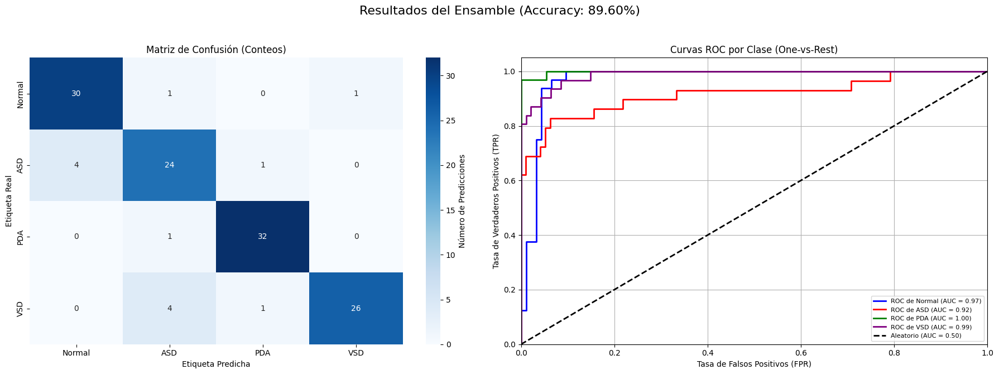


--- Reporte de Clasificación del Ensamble ---
              precision    recall  f1-score   support

      Normal       0.88      0.94      0.91        32
         ASD       0.80      0.83      0.81        29
         PDA       0.94      0.97      0.96        33
         VSD       0.96      0.84      0.90        31

    accuracy                           0.90       125
   macro avg       0.90      0.89      0.89       125
weighted avg       0.90      0.90      0.90       125



In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc
from itertools import cycle # Para las curvas ROC
def plot_ensemble_results(y_true, y_pred, y_prob, target_names, title="Resultados del Ensamble"):
    fig, axes = plt.subplots(1, 2, figsize=(18, 7))
    fig.suptitle(title, fontsize=16)

    # --- 1. Matriz de Confusión ---
    cm = confusion_matrix(y_true, y_pred)

    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", ax=axes[0],
                xticklabels=target_names, yticklabels=target_names, cbar_kws={'label': 'Número de Predicciones'})

    axes[0].set_title("Matriz de Confusión (Conteos)")
    axes[0].set_ylabel("Etiqueta Real")
    axes[0].set_xlabel("Etiqueta Predicha")

    # --- 2. Curvas ROC multiclass (One-vs-Rest) ---
    # Asume que y_true es un array de índices de clase (0, 1, 2, 3)
    # y y_prob son las probabilidades para cada clase [N_samples, N_classes]

    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    # Calcular para cada clase
    n_classes = len(target_names)
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true == i, y_prob[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Dibujar todas las curvas ROC
    colors = cycle(['blue', 'red', 'green', 'purple', 'orange', 'brown'])
    for i, color in zip(range(n_classes), colors):
        axes[1].plot(fpr[i], tpr[i], color=color, lw=2,
                 label=f'ROC de {target_names[i]} (AUC = {roc_auc[i]:.2f})')

    axes[1].plot([0, 1], [0, 1], 'k--', lw=2, label='Aleatorio (AUC = 0.50)')
    axes[1].set_xlim([0.0, 1.0])
    axes[1].set_ylim([0.0, 1.05])
    axes[1].set_xlabel('Tasa de Falsos Positivos (FPR)')
    axes[1].set_ylabel('Tasa de Verdaderos Positivos (TPR)')
    axes[1].set_title('Curvas ROC por Clase (One-vs-Rest)')
    axes[1].legend(loc="lower right", fontsize=8)
    axes[1].grid(True)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Ajusta el layout para el título
    plt.show()

    # --- Opcional: Imprimir Reporte de Clasificación ---
    print("\n--- Reporte de Clasificación del Ensamble ---")
    print(classification_report(y_true, y_pred, target_names=target_names))

    return fig

fig = plot_ensemble_results(
    y_true,
    y_pred,
    y_prob,
    target_names,
    title=f"Resultados del Ensamble (Accuracy: {accuracy*100:.2f}%)"
)

# Ensamble Ponderado EfficientNetB2 y ResNet50


## Definimos la arquitectura de los modelos

In [ ]:
import torch, torch.nn as nn
from torchvision import models
from torch.utils.data import DataLoader
from torchvision import transforms
from sklearn.metrics import classification_report, confusion_matrix

if 'model' in locals():
    del model

# Importante: forzar al colector de basura después de borrar
import gc
gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Datos: X_*_normalized (N,320,320,1) en [0,1]; Y_*_encoded one-hot (N,4)
num_classes = Y_train_encoded.shape[1]
y_train_idx = Y_train_encoded.argmax(1).astype(np.int64)
y_val_idx   = Y_val_encoded.argmax(1).astype(np.int64)
y_test_idx  = Y_test_encoded.argmax(1).astype(np.int64)

resnet_weights = ResNet50_Weights.IMAGENET1K_V2

class EfficientNetGray(nn.Module):
    def __init__(self, num_classes, pretrained=True):
        super().__init__()
        weights = models.EfficientNet_B2_Weights.IMAGENET1K_V1 if pretrained else None
        m = models.efficientnet_b2(weights=weights)

        original_conv_weights = m.features[0][0].weight.clone()

        m.features[0][0] = nn.Conv2d(1, 32, kernel_size=3, stride=2, padding=1, bias=False)

        if pretrained:
            m.features[0][0].weight.data = original_conv_weights.mean(dim=1, keepdim=True)

        in_feats = m.classifier[1].in_features
        m.classifier = nn.Sequential(
            nn.Dropout(p=0.4, inplace=True),
            nn.Linear(in_feats, num_classes)
        )
        self.net = m

    def forward(self, x):
        return self.net(x)

class ResNetClassifier(nn.Module):
    def __init__(self, num_classes, pretrained=True):
        super().__init__()
        weights = resnet_weights if pretrained else None
        m = models.resnet50(weights=weights)
        original_weights = m.conv1.weight.clone()

        m.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)

        if pretrained:
            m.conv1.weight.data = original_weights.mean(dim=1, keepdim=True)

        in_feats = m.fc.in_features
        m.fc = nn.Linear(in_feats, num_classes)

        self.net = m

    def forward(self, x):
        return self.net(x)

## Cargamos los modelos



In [ ]:

effnet_model = EfficientNetGray(num_classes=num_classes, pretrained=False).to(device)
resnet_model = ResNetClassifier(num_classes=num_classes, pretrained=False).to(device)

try:
    effnet_model.load_state_dict(torch.load("/content/drive/MyDrive/CARDIOS - PROYECTO INTEGRADOR/Modelos/best_model_efficient_net.pt"))
    resnet_model.load_state_dict(torch.load("/content/drive/MyDrive/CARDIOS - PROYECTO INTEGRADOR/Modelos/best_model_resnet50.pt"))
except Exception as e:
    print(f"Error cargando modelos: {e}")
    print("Asegúrate de que 'num_classes' sea correcto y los archivos .pt existan.")

effnet_model.eval()
resnet_model.eval()

print("Modelos EfficientNet y ResNet50 cargados y en modo .eval()")

Modelos EfficientNet y ResNet50 cargados y en modo .eval()


## Evaluacion Modelo ensamblado ponderado

In [ ]:
import torch.nn.functional as F
from torchvision import transforms
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np
import torch

class NumpyGrayDataset(Dataset):
    def __init__(self, x_nhwc, y_idx, transform=None):
        self.x = x_nhwc.astype(np.uint8)      # (N,H,W,1) en 0-255
        self.y = y_idx.astype(np.int64)
        self.transform = transform

    def __len__(self): return self.x.shape[0]

    def __getitem__(self, i):
        img = self.x[i]                        # (H,W,1)
        if self.transform is not None:
            img = self.transform(img)          # -> (3,224,224) float normalizado
        else:
            img = torch.from_numpy(np.transpose(img, (2,0,1))).float() / 255.0
            img = img.repeat(3, 1, 1)
        return img, self.y[i]

def evaluate_ensemble_weighted(model_A, model_B, loader, device, target_names, w_A=0.5, w_B=0.5):
    """
    Evalúa un ensamble ponderado.
    w_A y w_B deben sumar 1.0
    """
    model_A.eval()
    model_B.eval()

    all_labels = []
    all_preds_ensemble = []
    all_probs_ensemble = []

    with torch.no_grad():
        for xb, yb in loader:
            xb, yb = xb.to(device, non_blocking=True), yb.to(device, non_blocking=True)

            with torch.amp.autocast('cuda', enabled=torch.cuda.is_available()):
                logits_A = model_A(xb)
                logits_B = model_B(xb)

            final_logits = (logits_A * w_A) + (logits_B * w_B)

            probs = F.softmax(final_logits, dim=1)
            _, preds = final_logits.max(1)

            all_labels.append(yb.cpu())
            all_preds_ensemble.append(preds.cpu())
            all_probs_ensemble.append(probs.cpu())

    y_true = torch.cat(all_labels).numpy()
    y_pred = torch.cat(all_preds_ensemble).numpy()
    y_prob = torch.cat(all_probs_ensemble).numpy()

    accuracy = (y_pred == y_true).mean()

    print(f"--- RESULTADOS DEL ENSAMBLE (Ponderado w_A={w_A}, w_B={w_B}) ---")
    print(f"Accuracy: {accuracy * 100.0:.2f}%")

    return accuracy, y_true, y_pred, y_prob


target_names = ['Normal', 'ASD', 'PDA', 'VSD']

BATCH = 64
def chan_stats(x):
    m = float(x.mean()); s = float(x.std() + 1e-8)
    return m, s
mean_tr, std_tr = chan_stats(X_train_normalized[..., 0])

train_transforms = transforms.Compose([
    transforms.ToPILImage(),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomAffine(degrees=10, translate=(0.05, 0.05)),
    transforms.ToTensor(), # -> (1, H, W) en rango [0, 1]
    transforms.Normalize(mean=[mean_tr], std=[std_tr])
])

val_test_transforms = transforms.Compose([
    transforms.ToPILImage(),
    transforms.ToTensor(), # -> (1, H, W) en rango [0, 1]
    transforms.Normalize(mean=[mean_tr], std=[std_tr])
])

X_train_uint8 = (X_train_normalized * 255).astype(np.uint8)
X_val_uint8 = (X_val_normalized * 255).astype(np.uint8)
X_test_uint8 = (X_test_normalized * 255).astype(np.uint8)

train_dataset = NumpyGrayDataset(X_train_uint8, y_train_idx, transform=train_transforms)
val_dataset = NumpyGrayDataset(X_val_uint8, y_val_idx, transform=val_test_transforms)
test_dataset = NumpyGrayDataset(X_test_uint8, y_test_idx, transform=val_test_transforms)

dl_train = DataLoader(train_dataset, batch_size=BATCH, shuffle=True, num_workers=0, pin_memory=True)
dl_val = DataLoader(val_dataset, batch_size=BATCH, shuffle=False, num_workers=0, pin_memory=True)
dl_test = DataLoader(test_dataset, batch_size=BATCH, shuffle=False, num_workers=0, pin_memory=True)


print("Buscando los mejores pesos en el set de validación...")

# más peso a EfficientNet
acc_eff, _, _, _ = evaluate_ensemble_weighted(effnet_model, resnet_model, dl_val, device, target_names, w_A=0.6, w_B=0.4)
# más peso a ResNet
acc_res, _, _, _ = evaluate_ensemble_weighted(effnet_model, resnet_model, dl_val, device, target_names, w_A=0.4, w_B=0.6)
# 0/30
acc_eff_70, _, _, _ = evaluate_ensemble_weighted(effnet_model, resnet_model, dl_val, device, target_names, w_A=0.7, w_B=0.3)



Buscando los mejores pesos en el set de validación...
--- RESULTADOS DEL ENSAMBLE (Ponderado w_A=0.6, w_B=0.4) ---
Accuracy: 90.32%
--- RESULTADOS DEL ENSAMBLE (Ponderado w_A=0.4, w_B=0.6) ---
Accuracy: 91.94%
--- RESULTADOS DEL ENSAMBLE (Ponderado w_A=0.7, w_B=0.3) ---
Accuracy: 91.13%


In [ ]:
print("\nEvaluando la mejor combinación en el set de Test...")
accuracy, y_true, y_pred, y_prob = evaluate_ensemble_weighted(
    effnet_model,
    resnet_model,
    dl_test,
    device,
    target_names,
    w_A=0.4,
    w_B=0.6
)


Evaluando la mejor combinación en el set de Test...
--- RESULTADOS DEL ENSAMBLE (Ponderado w_A=0.4, w_B=0.6) ---
Accuracy: 88.80%


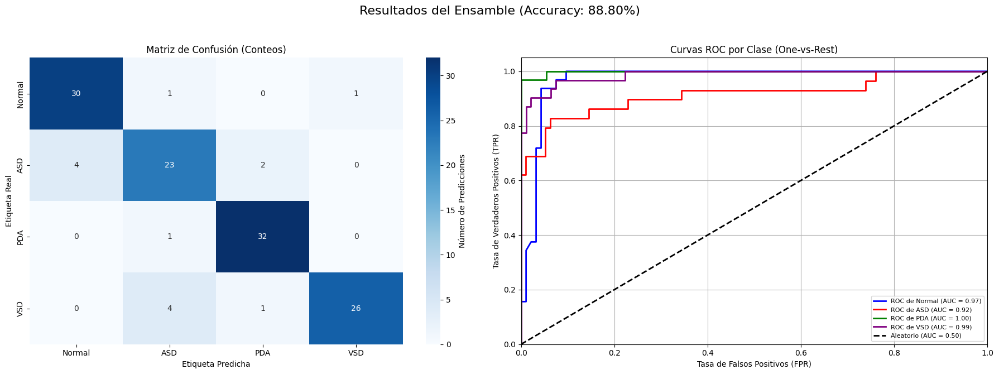


--- Reporte de Clasificación del Ensamble ---
              precision    recall  f1-score   support

      Normal       0.88      0.94      0.91        32
         ASD       0.79      0.79      0.79        29
         PDA       0.91      0.97      0.94        33
         VSD       0.96      0.84      0.90        31

    accuracy                           0.89       125
   macro avg       0.89      0.88      0.88       125
weighted avg       0.89      0.89      0.89       125



In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc
from itertools import cycle # Para las curvas ROC
def plot_ensemble_results(y_true, y_pred, y_prob, target_names, title="Resultados del Ensamble"):
    fig, axes = plt.subplots(1, 2, figsize=(18, 7))
    fig.suptitle(title, fontsize=16)

    # --- 1. Matriz de Confusión ---
    cm = confusion_matrix(y_true, y_pred)

    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", ax=axes[0],
                xticklabels=target_names, yticklabels=target_names, cbar_kws={'label': 'Número de Predicciones'})

    axes[0].set_title("Matriz de Confusión (Conteos)")
    axes[0].set_ylabel("Etiqueta Real")
    axes[0].set_xlabel("Etiqueta Predicha")

    # --- 2. Curvas ROC multiclass (One-vs-Rest) ---
    # Asume que y_true es un array de índices de clase (0, 1, 2, 3)
    # y y_prob son las probabilidades para cada clase [N_samples, N_classes]

    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    # Calcular para cada clase
    n_classes = len(target_names)
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true == i, y_prob[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Dibujar todas las curvas ROC
    colors = cycle(['blue', 'red', 'green', 'purple', 'orange', 'brown'])
    for i, color in zip(range(n_classes), colors):
        axes[1].plot(fpr[i], tpr[i], color=color, lw=2,
                 label=f'ROC de {target_names[i]} (AUC = {roc_auc[i]:.2f})')

    axes[1].plot([0, 1], [0, 1], 'k--', lw=2, label='Aleatorio (AUC = 0.50)')
    axes[1].set_xlim([0.0, 1.0])
    axes[1].set_ylim([0.0, 1.05])
    axes[1].set_xlabel('Tasa de Falsos Positivos (FPR)')
    axes[1].set_ylabel('Tasa de Verdaderos Positivos (TPR)')
    axes[1].set_title('Curvas ROC por Clase (One-vs-Rest)')
    axes[1].legend(loc="lower right", fontsize=8)
    axes[1].grid(True)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Ajusta el layout para el título
    plt.show()

    # --- Opcional: Imprimir Reporte de Clasificación ---
    print("\n--- Reporte de Clasificación del Ensamble ---")
    print(classification_report(y_true, y_pred, target_names=target_names))

    return fig

fig = plot_ensemble_results(
    y_true,
    y_pred,
    y_prob,
    target_names,
    title=f"Resultados del Ensamble (Accuracy: {accuracy*100:.2f}%)"
)

# Análisis comparativo del modelo EfficientB2 individial frente al ensamble ponderado

**Desempeño General**

El ensamble mejora todos los indicadores globales, especialmente la estabilidad y sensibilidad media, mostrando un balance más homogéneo entre clases.
El aumento de +1.6 % en exactitud y +1.8 % en F1 macro sugiere que el ensamble logró complementar las debilidades de cada modelo individual (ResNet50 más robusto, EfficientNet más discriminativo).


| Modelo                       | Exactitud Global | F1-Macro   | Balanced Accuracy | PR-AUC / ROC-AUC                   |
| ---------------------------- | ---------------- | ---------- | ----------------- | ---------------------------------- |
| **EfficientNetB2**           | 87.2 %           | 86.7 %     | 91.2 %            | PR-AUC 92.7 %                      |
| **Ensamble (B2 + ResNet50)** | **88.8 %**       | **88.5 %** | **92.4 %**        | **PR-AUC 93.1 % / ROC-AUC 96.8 %** |






**Matriz de Confusión y Métricas por Clase**

EfficientNetB2
- Normal: Sens. 93.7 %, Espec. 91.4 % — buen rendimiento general.

- ASD: Sens. 65.5 %, Espec. 99 % — principal área de debilidad; tiende a confundir ASD con Normal o PDA.

- PDA y VSD: Sens. > 93 %, excelente discriminación en casos hemodinámicamente significativos.


Ensamble B2 + ResNet50

- ASD mejora sensiblemente (65.5 % → 79.3 %), mostrando el mayor beneficio clínico.

- PDA alcanza 97 % de sensibilidad y 96.7 % de especificidad — prácticamente perfecto.

- VSD conserva alta precisión (96 % PPV), aunque su sensibilidad cae ligeramente a 83.9 %.

- Normal mantiene estabilidad con 93.7 % sensibilidad y 95.7 % especificidad.


En conjunto, el **ensamble reduce los falsos negativos y mantiene un excelente equilibrio entre sensibilidad y especificidad**, lo que es crítico para un entorno clínico.

**Análisis de las Curvas ROC**
Las curvas ROC confirman la capacidad discriminativa superior del ensamble por las siguientes razones:
- AUC promedio ≈ 0.97 → excelente clasificación multiclase.
- PDA (AUC = 1.00) y VSD (AUC = 0.99) son las clases mejor definidas.
- ASD (AUC = 0.92) mejora respecto a B2 individual, indicando mejor capacidad del modelo combinado para detectar patrones sutiles.

**Desempeño Específico en la Clase ASD**


Para la clase ASD (Atrial Septal Defect) es sin duda, la más crítica para analizar en este proyecto porque representa un caso clínico más sutil y difícil de detectar radiográficamente en nuestro modelo al dia de hoy.

| Modelo                     | Sensibilidad (Recall) | Especificidad | PPV (Precisión) |   NPV  | AUC (ROC) |
| :------------------------- | :-------------------: | :-----------: | :-------------: | :----: | :-------: |
| **EfficientNetB2**         |       **65.5 %**      |     99.0 %    |      95.0 %     | 90.5 % |     —     |
| **Ensamble B2 + ResNet50** |       **79.3 %**      |     93.7 %    |      79.3 %     | 93.7 % |  **0.92** |





- Incremento de sensibilidad +13.8 puntos (65.5 → 79.3 %). Este salto es clave clínicamente, porque el modelo ahora detecta 4 de cada 5 casos de ASD, mientras que el modelo individual fallaba en casi 1 de cada 3.

- Ligera reducción en especificidad (99.0 → 93.7 %). Era esperable: el modelo pasa de ser conservador a más sensible, es decir, acepta más falsos positivos con tal de no perder verdaderos casos.

- Disminución del PPV (Precisión) (95.0 → 79.3 %). Posiblemente relacionado con el aumento de sensibilidad. Algunos casos Normal o VSD leves fueron erróneamente clasificados como ASD, pero esto amplía el rango de detección sin comprometer drásticamente el rendimiento general.

**Conclusiones Generales**
- El ensamble ponderado EfficientNetB2 + ResNet50 es el modelo más equilibrado y robusto, alcanzando el mejor desempeño global (Accuracy = 88.8 %, F1 = 88.5 %, Balanced Acc = 92.4 %).
- Logra mejorar la detección de ASD, el subtipo históricamente más difícil en el desarrollo de nuestro modelo clasificador, esto lo logra sin degradar el rendimiento en las demás clases.
- EfficientNetB2 por sí solo sigue siendo un modelo de referencia por su eficiencia y convergencia estable, pero el ensamble aporta mayor estabilidad y discriminación clínica.

# GradCAM - Ensamble Ponderado

Es necesario cargar previamente los modelos de la seccion anterior y ejecutar sus celdas


## Clases y funciones de Ensable ponderado con GradCAM

In [ ]:
## -----OPCIONAL----

import numpy as np
from torchvision import transforms

def chan_stats(x):
    x = x.astype(np.float32)
    m = float(x.mean())
    s = float(x.std() + 1e-8)
    return m, s

try:
    _arr_for_stats = X_train_normalized[..., 0]  # (N,H,W)
except NameError:
    _arr_for_stats = X_test_normalized[..., 0]   # fallback

mean_tr, std_tr = chan_stats(_arr_for_stats)
print(f"[Norm] mean={mean_tr:.4f}, std={std_tr:.4f}")

# === mismas transforms que en valid/test ===
val_test_transforms = transforms.Compose([
    transforms.ToPILImage(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[mean_tr], std=[std_tr])
])

[Norm] mean=0.6007, std=0.1668


In [ ]:
import torch
import torch.nn.functional as F

class SimpleGradCAMGeneric:
    def __init__(self, model, target_layer):
        self.model = model
        self.model.eval()
        self.feats = {}
        self.h1 = target_layer.register_forward_hook(self._fwd_hook)
        self.h2 = target_layer.register_full_backward_hook(self._bwd_hook)

    def _fwd_hook(self, m, i, o):
        self.feats['acts'] = o.detach()               # (B,C,h,w)
    def _bwd_hook(self, m, gin, gout):
        self.feats['grads'] = gout[0].detach()        # (B,C,h,w)

    def remove(self):
        self.h1.remove(); self.h2.remove()

    def __call__(self, x, class_idx):
        """
        x: (1,1,H,W) tensor normalizado igual que en valid/test
        class_idx: int de la clase objetivo
        return: CAM (1,1,H,W) en [0,1]
        """
        self.model.zero_grad(set_to_none=True)
        logits = self.model(x)                        # (1,C)
        score = logits[0, class_idx]

        self.model.zero_grad(set_to_none=True)
        score.backward(retain_graph=True)

        A  = self.feats['acts'][0]                   # (C,h,w)
        dA = self.feats['grads'][0]                  # (C,h,w)
        w  = dA.mean(dim=(1,2))                      # (C,)
        cam = (w.view(-1,1,1) * A).sum(dim=0)        # (h,w)
        cam = F.relu(cam)

        cam = cam - cam.min()
        cam = cam / (cam.max() + 1e-8)
        cam = F.interpolate(cam[None,None], size=x.shape[-2:], mode='bilinear', align_corners=False)
        return cam.cpu()


In [ ]:
import os, numpy as np, torch
import matplotlib.pyplot as plt

class_names = ['Normal','ASD','PDA','VSD']

def tensor_from_index(i):
    img_np = (X_test_normalized[i] * 255).astype(np.uint8)
    x = val_test_transforms(img_np).unsqueeze(0).to(device)
    y_true = int(y_test_idx[i])
    return x, y_true


def show_overlay(x_1ch, cam_1ch, title=""):
    x_np = x_1ch[0,0].detach().cpu().float().numpy()
    x_disp = (x_np - x_np.min()) / (x_np.max() - x_np.min() + 1e-8)
    cam_np = cam_1ch[0,0].detach().cpu().numpy()

    plt.figure(figsize=(9,3))
    plt.subplot(1,3,1); plt.title("Imagen");  plt.imshow(x_disp, cmap='gray'); plt.axis('off')
    plt.subplot(1,3,2); plt.title("Grad-CAM"); plt.imshow(cam_np, cmap='jet'); plt.axis('off')
    plt.subplot(1,3,3); plt.title("Overlay");
    plt.imshow(x_disp, cmap='gray'); plt.imshow(cam_np, cmap='jet', alpha=0.45); plt.axis('off')
    plt.suptitle(title); plt.tight_layout(); plt.show()


def gradcam_ensemble_for_image(img_tensor,
                               eff_model, res_model,
                               layer_eff, layer_res,
                               alpha=0.6, beta=0.4,
                               class_idx=None):
    """
    img_tensor: (1,1,H,W) ya normalizado
    alpha/beta: pesos del ensamble (alpha + beta ≈ 1)
    class_idx: si None, usa la clase top-1 del ENSAMBLE
    return: cam_ens (1,1,H,W), used_idx (int), probs_ens (np.array [C]),
            cam_eff (1,1,H,W), cam_res (1,1,H,W)
    """
    eff_model.eval(); res_model.eval()

    with torch.no_grad():
        logits_eff = eff_model(img_tensor)
        logits_res = res_model(img_tensor)
        logits_ens = alpha * logits_eff + beta * logits_res
        probs_ens  = torch.softmax(logits_ens, dim=1)

    if class_idx is None:
        class_idx = int(logits_ens.argmax(1).item())

    # CAM individual por modelo (misma clase objetivo)
    cam_eff_ex = SimpleGradCAMGeneric(eff_model, layer_eff)
    cam_res_ex = SimpleGradCAMGeneric(res_model, layer_res)

    cam_eff = cam_eff_ex(img_tensor, class_idx=class_idx)   # (1,1,H,W)
    cam_res = cam_res_ex(img_tensor, class_idx=class_idx)

    cam_eff_ex.remove(); cam_res_ex.remove()

    # Combinación ponderada de los mapas
    cam_ens = alpha * cam_eff + beta * cam_res
    cam_ens = cam_ens / (cam_ens.max() + 1e-8)

    return cam_ens, class_idx, probs_ens[0].detach().cpu().numpy(), cam_eff, cam_res



def gradcam_ensemble_examples_by_class(k_per_class=3, mode="pred",
                                       alpha=0.6, beta=0.4,
                                       save_dir="gradcam_by_class_ensemble"):
    """
    mode:
      - "pred": CAM de la clase PREDICHA por el ENSAMBLE
      - "true": CAM forzando la clase VERDADERA
    """
    np.random.seed(42)
    target_eff = effnet_model.net.features[-1][0]
    target_res = resnet_model.net.layer4[-1].conv3

    for c in range(len(class_names)):
        idxs = np.where(y_test_idx == c)[0]
        if len(idxs) == 0:
            print(f"[{class_names[c]}] sin ejemplos en test.")
            continue
        sel = idxs if len(idxs) <= k_per_class else np.random.choice(idxs, size=k_per_class, replace=False)
        print(f"\n=== Clase verdadera: {class_names[c]} (n={len(idxs)}) | mostrando {len(sel)} ===")

        for i in sel:
            x, y_true = tensor_from_index(i)

            # logits del ensamble para decidir clase si mode="pred"
            with torch.no_grad():
                logits_eff = effnet_model(x)
                logits_res = resnet_model(x)
                logits_ens = alpha*logits_eff + beta*logits_res
                probs_ens  = torch.softmax(logits_ens, dim=1)[0].detach().cpu().numpy()
                y_pred = int(logits_ens.argmax(1).item())

            used_idx = (c if mode == "true" else y_pred)

            # CAM del ensamble (misma clase objetivo para ambos)
            cam_ens, _, _, _, _ = gradcam_ensemble_for_image(
                x, effnet_model, resnet_model, target_eff, target_res,
                alpha=alpha, beta=beta, class_idx=used_idx
            )

            title = f"Ensamble | True: {class_names[y_true]} | CAM→ {class_names[used_idx]} | Pred: {class_names[y_pred]} ({probs_ens[y_pred]:.2f}) | idx={i}"
            save_path = os.path.join(save_dir, class_names[y_true], f"idx{i}_CAM-{class_names[used_idx]}_PRED-{class_names[y_pred]}.png")

            # guardar/mostrar
            os.makedirs(os.path.dirname(save_path), exist_ok=True)
            show_overlay(x, cam_ens, title=title)
            # Si deseas guardar:
            # plt.savefig(save_path, dpi=200, bbox_inches='tight'); plt.close()


## Ejecucion  y Analisis GradCAM


=== Clase verdadera: Normal (n=32) | mostrando 3 ===


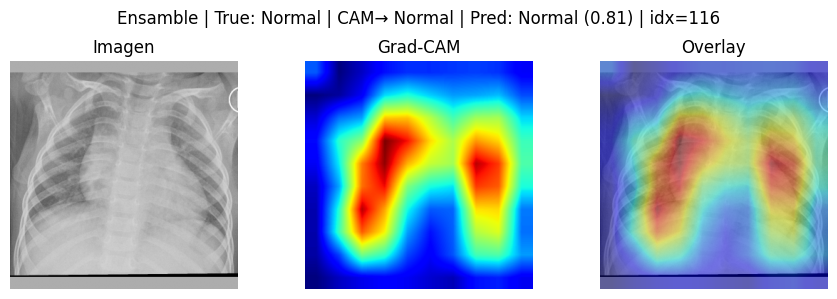

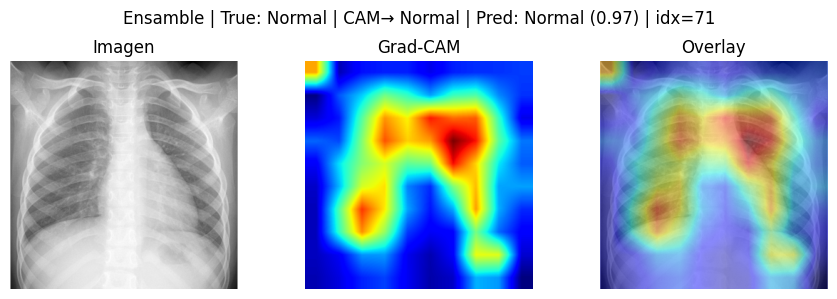

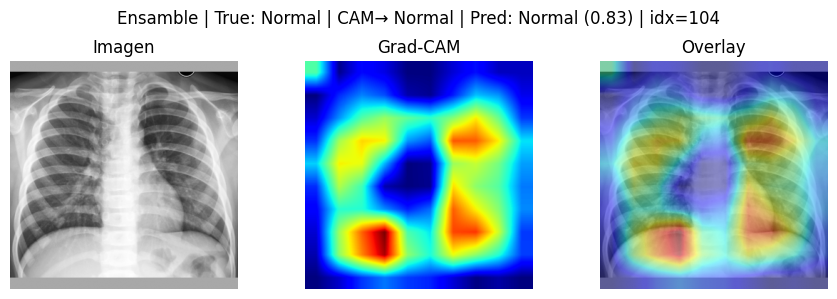


=== Clase verdadera: ASD (n=29) | mostrando 3 ===


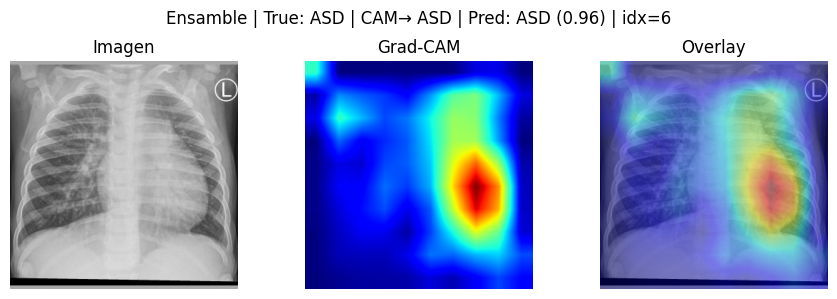

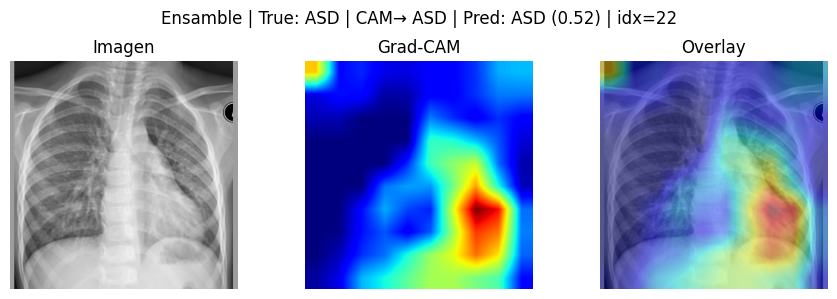

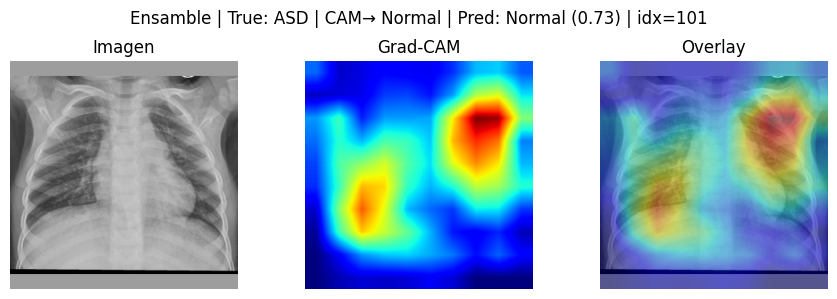


=== Clase verdadera: PDA (n=33) | mostrando 3 ===


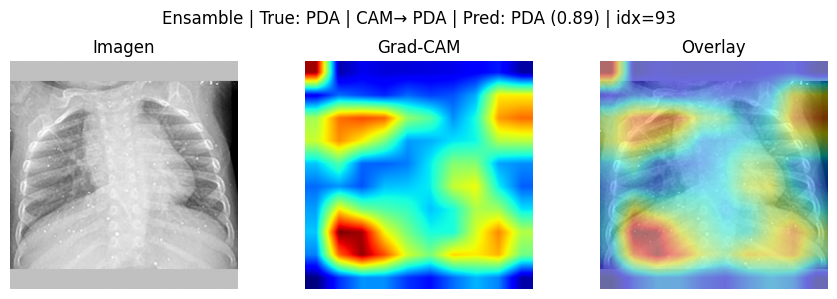

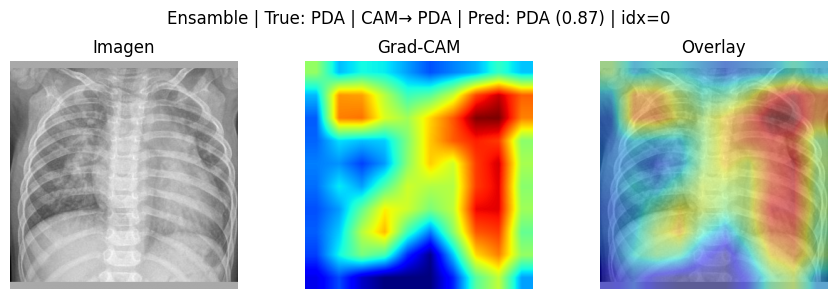

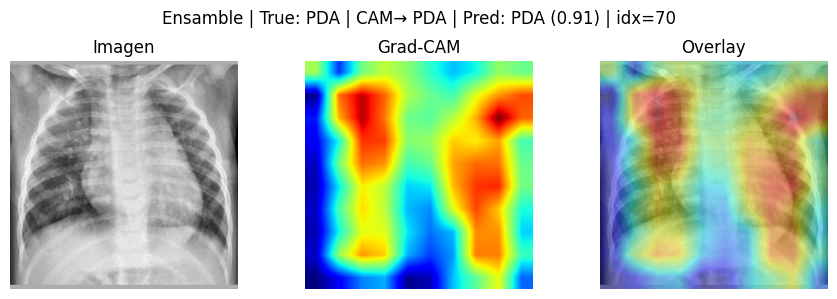


=== Clase verdadera: VSD (n=31) | mostrando 3 ===


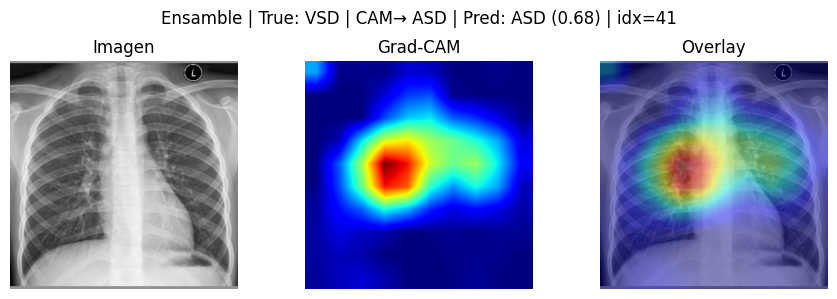

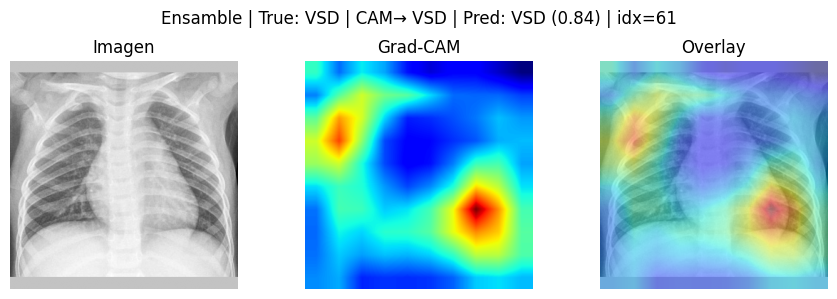

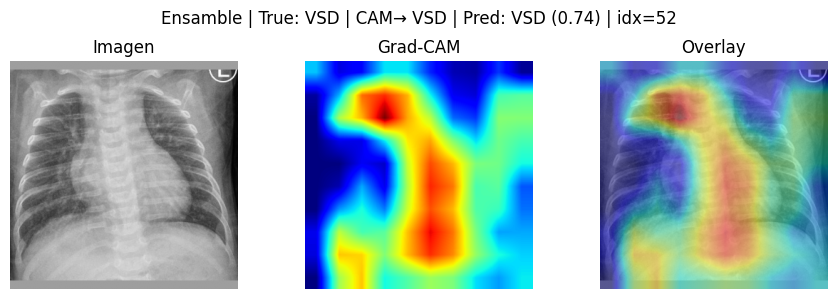

In [ ]:
gradcam_ensemble_examples_by_class(
    k_per_class=3,
    mode="pred",              # "pred" o "true" para forzar CAM hacia la clase verdadera
    alpha=0.6, beta=0.4,      # ponderaciones elegidas en validación
    save_dir="gradcam_by_class_ensemble"
)

Los mapas Grad-CAM del modelo ensamble permiten visualizar las regiones anatómicas que más influyen en la predicción final. En conjunto, revelan una atención más localizada, coherente con la anatomía cardiotorácica y con los patrones clínicos esperados para cada tipo de cardiopatía.

**Clase Normal**

El modelo reconoce correctamente los casos normales priorizando la homogeneidad pulmonar y la simetría torácica, lo cual refleja una base anatómica estable y bien aprendida.

- Las activaciones se concentran de manera bilateral en los campos pulmonares medios e inferiores.
- Las regiones cardíacas aparecen con baja intensidad, lo que indica que el modelo no detecta alteraciones estructurales significativas.
- Los patrones térmicos son simétricos, y no hay puntos de hiperactivación sobre la silueta cardiaca.


**Clase ASD (Atrial Septal Defect)**

El ensamble logró identificar patrones funcionales del flujo pulmonar y cambios estructurales discretos asociados al ASD.
La atención más centrada y localizada sugiere que la combinación EfficientNet + ResNet permitió detectar anomalías hemodinámicas leves que antes pasaban inadvertidas.
Sin embargo, la variabilidad de los mapas en ASD evidencia que sigue siendo la clase más desafiante visualmente, lo cual concuerda con su menor sensibilidad relativa (79.3 %).

- Las activaciones más intensas se concentran en la región central.
- En los casos correctamente clasificados (Pred: ASD), el modelo resalta una zona focal central, por definir si esto es compatible con hiperflujo o sobrecarga auricular derecha.
- En los casos mal clasificados como Normal, las activaciones se dispersan bilateralmente, **indicando incertidumbre del modelo.**



**Clase PDA (Patent Ductus Arteriosus)**

El modelo ensamble logra una detección anatómicamente precisa de PDA, destacando los flujos pulmonares y las bases cardíacas como regiones de alta relevancia.
Esto respalda las métricas observadas (Sensibilidad 97 %, Especificidad 96.7 %, AUC = 1.00), consolidando al PDA como la clase mejor reconocida.

- Los mapas muestran activaciones en ambos hilios pulmonares y la base cardíaca izquierda, que pueden coincidir con las áreas donde se manifiesta el hiperflujo pulmonar típico del ductus persistente.
- Necesitamos verificar que: Las regiones de focos de alta intensidad (rojo brillante) delinen la zona de sobrecarga vascular.


**Clase VSD (Ventricular Septal Defect)**

El ensamble demuestra capacidad de identificar defectos septales, pero con una leve dispersión en los focos de atención, lo que explica su sensibilidad algo menor (83.9 %).
No obstante, las activaciones se mantienen dentro de zonas anatómicamente plausibles, lo que sugiere un entendimiento estructural correcto aunque con menor confianza en casos atípicos.

- Las activaciones se centran en la región media e inferior.
- En las predicciones correctas, el modelo concentra energía en la silueta cardíaca media; en errores (confusión con ASD), el foco se desplaza hacia el campo pulmonar derecho.
- Se observa una transición más difusa de las activaciones, reflejando la variabilidad para la clase VSD en radiografías simples.


# Conclusión

Los resultados obtenidos en la fase experimental demuestran que el ensamble EfficientNetB2 + ResNet50 ofrece el mejor balance entre desempeño cuantitativo, estabilidad inter-clases y relevancia clínica. Si bien EfficientNetB2 había mostrado un rendimiento muy competitivo en la evaluación individual, el modelo combinado logró incrementos consistentes en exactitud (+1.6 %), F1 macro (+1.8 %) y Balanced Accuracy (+1.2 %), indicando una mejora real en la capacidad del sistema para reconocer patrones heterogéneos en todas las clases diagnósticas.

El principal impacto positivo del ensamble se observa en la detección del defecto septal auricular (ASD), la categoría históricamente más difícil debido a su presentación radiológica sutil. El incremento de +13.8 puntos en sensibilidad (65.5 % → 79.3 %) implica que el nuevo modelo detecta 4 de cada 5 casos de ASD, reduciendo significativamente el riesgo clínico asociado a falsos negativos. Aunque esto se acompaña de una ligera disminución en especificidad, el beneficio clínico supera ampliamente este compromiso, dado que un diagnóstico temprano favorece el pronóstico en cardiopatías congénitas.

Además, las curvas ROC del ensamble (AUC macro ≈ 0.97) consolidan su capacidad discriminativa, alcanzando rendimiento prácticamente perfecto en PDA (AUC = 1.00) y VSD (AUC = 0.99). En conjunto, estas métricas evidencian un modelo más robusto y confiable frente a casos variados y potencialmente ruidosos.

Finalmente, el análisis con Grad-CAM confirma que el ensamble no solo predice mejor, sino que razona mejor: las activaciones se localizan de forma más anatómicamente coherente, apoyando la interpretabilidad del sistema y aumentando la confianza en su uso clínico. Esta trazabilidad visual resulta esencial para la adopción de herramientas de IA en medicina.

**Modelo final seleccionado**:
*Ensamble EfficientNetB2 + ResNet50*

Motivos principales: mejor desempeño global, mejor sensibilidad en ASD, mayor estabilidad inter-clases y explicabilidad anatómica superior.
Con este resultado, el sistema queda preparado para su validación externa, la expansión del dataset y la integración con el pipeline completo de clasificación automática como apoyo en el diagnóstico radiológico de cardiopatías congénitas.

# Referencias

* Singh, A. (2023, julio 14). Comprehensive Guide to Ensemble Learning (with Python codes). Analytics Vidhya.

* VanderPlas, J. (2022). Python Data Science Handbook (2nd ed.). O´Reilly Media.

* P, Alex (2021, April 12). How to train an ensemble of convolutional neural networks for image classification. Medium. https://medium.com/@alexppppp/how-to-train-an-ensemble-of-convolutional-neural-networks-for-image-classification-8fc69b087d3

* Hussain, A., & Aslam, A. (2024). Ensemble-based approach using inception V2, VGG-16, and Xception convolutional neural networks for surface cracks detection. Journal of Applied Research and Technology, 22(4), 586-598. https://jart.icat.unam.mx/index.php/jart/article/view/2431/1135